---

# Testing run script

In [1]:
import subprocess

subprocess.run([
    'python',
    'src/unox/HPC/run_model.py',
    'HPC_runs/y_refactor_0'
])


===== Begin run_model.py =====
Current working directory: /home/mschee/unox
Using input arguments:
	argv[1], savedir: HPC_runs/y_refactor_0/
	     config_file: HPC_runs/y_refactor_0/model_config.json
	argv[2], version: 1
Preparing input data for stage 2 of training.
	start_date: 2014-01-01
	end_date: 2018-12-31
Getting array of x input data
	Applying scale factor of 1000000000000.0 to variable nox.
	Applying scale factor of 0.001 to variable no2.
	Applying scale factor of 0.001 to variable blh.
	Applying scale factor of 1 to variable skt.
	Applying scale factor of 1e-05 to variable sp.
	Applying scale factor of 1e-06 to variable ssrd.
	Applying scale factor of 1 to variable t2m.
	Applying scale factor of 1 to variable u10.
	Applying scale factor of 1 to variable v10.
	Applying scale factor of 0.001 to variable no2_tm1.
	Start date: 2014-01-01. End date: 2018-12-31.
	Trimmed date range: 2014-01-01T00:00:00.000000000 to 2018-12-31T00:00:00.000000000
	Loaded no2_s2 with shape (1826, 56, 

CompletedProcess(args=['python', 'src/unox/HPC/run_model.py', 'HPC_runs/y_refactor_0'], returncode=0)

In [ ]:
from unox.HPC.data0.load_input import get_npy_from_netcdf
from unox.HPC.data0.dataset import uarray
from numpy import datetime64

uarr = uarray('no2_2005_2020', is_input_set=True)

this_npy, lats, lons = get_npy_from_netcdf(
# this_npy = get_npy_from_netcdf(
    uarr.xr,
    'model_configs/sample_config.json',
    start_date='2018-01-01',
    end_date='2019-12-31',
    x_or_y='x'
)

print(f"Shape of this_npy: {this_npy.shape}")
print(f"Data type of this_npy: {this_npy.dtype}")

	Loaded no2 with shape (730, 56, 120)
	Loaded no2_tm1 with shape (730, 56, 120)
	Loaded u10 with shape (730, 56, 120)
	Loaded v10 with shape (730, 56, 120)
	Loaded blh with shape (730, 56, 120)
	Loaded sp with shape (730, 56, 120)
	Loaded skt with shape (730, 56, 120)
	Loaded t2m with shape (730, 56, 120)
	Loaded ssrd with shape (730, 56, 120)
Shape of this_npy: (730, 56, 120, 9)
Data type of this_npy: float64


In [19]:
from unox.HPC.data0.run_functions import prepare_input
from unox.HPC.data0.dataset import uarray

uarr = uarray('no2_2005_2020_old', is_input_set=True)
uarr.xr

<xarray.Dataset> Size: 3GB
Dimensions:     (lat: 56, lon: 120, time: 5843)
Coordinates:
  * lat         (lat) float32 224B 11.78 12.9 14.02 15.14 ... 71.21 72.34 73.46
  * lon         (lon) float32 480B -174.4 -173.2 -172.1 ... -42.75 -41.62 -40.5
  * time        (time) datetime64[ns] 47kB 2005-01-02 2005-01-03 ... 2020-12-31
Data variables: (12/13)
    nox         (time, lat, lon) float32 157MB ...
    no2         (time, lat, lon) float32 157MB ...
    no2_s2      (time, lat, lon) float32 157MB ...
    blh         (time, lat, lon) float64 314MB ...
    lsm         (time, lat, lon) float64 314MB ...
    skt         (time, lat, lon) float64 314MB ...
    ...          ...
    ssrd        (time, lat, lon) float64 314MB ...
    t2m         (time, lat, lon) float64 314MB ...
    u10         (time, lat, lon) float64 314MB ...
    v10         (time, lat, lon) float64 314MB ...
    no2_tm1     (time, lat, lon) float32 157MB ...
    no2_s2_tm1  (time, lat, lon) float32 157MB ...
Attributes: (12/19)
    name:                        no2_2005_2020
    y_var:                       nox
    x_vars:                      ['no2', 'no2_tm1', 'u10', 'v10', 'blh', 'sp'...
    start_date:                  2005-01-01
    end_date:                    2020-12-31
    stage_2:                     1
    ...                          ...
    attrs_emiss_original_type:   dict
    attrs_chemra_original_type:  dict
    attrs_insitu_original_type:  dict
    attrs_met_original_type:     dict
    modification_date:           2026-03-25 17:07:28
    description:                 Input data for the Unet model.

In [13]:
import numpy as np

this_run = 'input_refac0'

# Load .npy files
x_stage1_npy = np.load(f'HPC_runs/{this_run}/xtrain_stage1.npy')
print(f"Shape of x_stage1_npy: {x_stage1_npy.shape}")
y_stage1_npy = np.load(f'HPC_runs/{this_run}/ytrain_stage1.npy')
print(f"Shape of y_stage1_npy: {y_stage1_npy.shape}")
x_stage2_npy = np.load(f'HPC_runs/{this_run}/xtrain_stage2.npy')
print(f"Shape of x_stage2_npy: {x_stage2_npy.shape}")
y_stage2_npy = np.load(f'HPC_runs/{this_run}/ytrain_stage2.npy')
print(f"Shape of y_stage2_npy: {y_stage2_npy.shape}")

Shape of x_stage1_npy: (5112, 56, 120, 9)
Shape of y_stage1_npy: (5112, 56, 120, 1)
Shape of x_stage2_npy: (1826, 56, 120, 9)
Shape of y_stage2_npy: (1826, 56, 120, 1)


In [29]:
# Compare y arrays between stage 1 and stage 2
print(f"Comparing y_stage1_npy and y_stage2_npy:")
# Trim stage 1 y array to match the time dimension of stage 2 y array
y_stage1_trimmed = y_stage1_npy[-y_stage2_npy.shape[0]:, ...]
if y_stage1_trimmed.shape != y_stage2_npy.shape:
    raise ValueError(f"Shapes of y_stage1_trimmed and y_stage2_npy do not match: {y_stage1_trimmed.shape} vs {y_stage2_npy.shape}")
if np.array_equal(y_stage1_trimmed, y_stage2_npy):
    print("The y arrays are the same after trimming stage 1 to match stage 2.")
elif np.allclose(y_stage1_trimmed, y_stage2_npy, atol=1e-5):
    print("The y arrays are approximately the same after trimming stage 1 to match stage 2 (within tolerance).")
else:
    print("The y arrays are different even after trimming stage 1 to match stage 2.")
    # Find the mean value of both arrays
    mean_stage1 = np.mean(y_stage1_trimmed)
    mean_stage2 = np.mean(y_stage2_npy)
    print(f"Mean of y_stage1_trimmed: {mean_stage1}")
    print(f"Mean of y_stage2_npy: {mean_stage2}")
    # Find the difference between the two arrays
    difference = y_stage1_trimmed - y_stage2_npy
    print(f"Mean difference between y_stage1_trimmed and y_stage2_npy: {np.mean(difference)}")
    print(f"Max absolute difference between y_stage1_trimmed and y_stage2_npy: {np.max(np.abs(difference))}")

Comparing y_stage1_npy and y_stage2_npy:
The y arrays are the same after trimming stage 1 to match stage 2.


In [ ]:
from unox.HPC.data0.load_input import get_npy_from_netcdf

this_npy1, lats, lons, times = get_npy_from_netcdf(
    uarr.xr,
    'model_configs/sample_config.json',
    start_date='2005-01-02',
    end_date='2018-12-31',
    x_or_y='y',
)
print(f"Shape of this_npy1: {this_npy1.shape}")
this_npy2, lats, lons, times = get_npy_from_netcdf(
    uarr.xr,
    'model_configs/sample_config.json',
    start_date='2014-01-01',
    end_date='2018-12-31',
    x_or_y='y',
)
print(f"Shape of this_npy2: {this_npy2.shape}")

	Applying scale factor of 1000000000000.0 to variable nox.
	Applying scale factor of 0.001 to variable no2.
	Applying scale factor of 0.001 to variable blh.
	Applying scale factor of 1 to variable skt.
	Applying scale factor of 1e-05 to variable sp.
	Applying scale factor of 1e-06 to variable ssrd.
	Applying scale factor of 1 to variable t2m.
	Applying scale factor of 1 to variable u10.
	Applying scale factor of 1 to variable v10.
	Applying scale factor of 0.001 to variable no2_tm1.
	Start date: 2005-01-02. End date: 2018-12-31.
	Trimmed date range: 2005-01-02T00:00:00.000000000 to 2018-12-31T00:00:00.000000000
	Loaded nox with shape (5112, 56, 120)
Shape of this_npy: (5112, 56, 120, 1)
	Applying scale factor of 1000000000000.0 to variable nox.
	Applying scale factor of 0.001 to variable no2.
	Applying scale factor of 0.001 to variable blh.
	Applying scale factor of 1 to variable skt.
	Applying scale factor of 1e-05 to variable sp.
	Applying scale factor of 1e-06 to variable ssrd.
	App

In [27]:
# Compare this_npy2 with the end of this_npy1
this_npy1_end = this_npy1[-this_npy2.shape[0]:, ...]
print(f"Shape of this_npy1_end: {this_npy1_end.shape}")
if np.array_equal(this_npy1_end, this_npy2):
    print("this_npy2 is the same as the end of this_npy1.")
elif np.allclose(this_npy1_end, this_npy2, atol=1e-5):
    print("this_npy2 is approximately the same as the end of this_npy1 (within tolerance).")
else:
    print("this_npy2 is different from the end of this_npy1.")
    # Find the mean value of both arrays
    mean_npy1_end = np.mean(this_npy1_end)
    mean_npy2 = np.mean(this_npy2)
    print(f"Mean of this_npy1_end: {mean_npy1_end}")
    print(f"Mean of this_npy2: {mean_npy2}")
    # Find the difference between the two arrays
    difference = this_npy1_end - this_npy2
    print(f"Mean difference between this_npy1_end and this_npy2: {np.mean(difference)}")
    print(f"Max absolute difference between this_npy1_end and this_npy2: {np.max(np.abs(difference))}")

Shape of this_npy1_end: (1826, 56, 120, 1)
this_npy2 is the same as the end of this_npy1.


In [24]:
# Compare this_npy with y_stage1_npy and y_stage2_npy
if np.array_equal(this_npy, y_stage1_npy):
    print("this_npy is the same as y_stage1_npy.")
# if np.array_equal(this_npy, y_stage2_npy):
#     print("this_npy is the same as y_stage2_npy.")

this_npy is the same as y_stage1_npy.


In [21]:
# Compare this_npy with y_stage1_npy and y_stage2_npy
if np.array_equal(this_npy, y_stage1_trimmed):
    print("this_npy is the same as y_stage1_npy.")
if np.array_equal(this_npy, y_stage2_npy):
    print("this_npy is the same as y_stage2_npy.")

this_npy is the same as y_stage2_npy.


In [11]:
from unox.HPC.data0.dataset import uarray

uarr = uarray('no2_2005_2020_old', is_input_set=True)
uarr.xr

<xarray.Dataset> Size: 3GB
Dimensions:     (lat: 56, lon: 120, time: 5843)
Coordinates:
  * lat         (lat) float32 224B 11.78 12.9 14.02 15.14 ... 71.21 72.34 73.46
  * lon         (lon) float32 480B -174.4 -173.2 -172.1 ... -42.75 -41.62 -40.5
  * time        (time) datetime64[ns] 47kB 2005-01-02 2005-01-03 ... 2020-12-31
Data variables: (12/13)
    nox         (time, lat, lon) float32 157MB ...
    no2         (time, lat, lon) float32 157MB ...
    no2_s2      (time, lat, lon) float32 157MB ...
    blh         (time, lat, lon) float64 314MB ...
    lsm         (time, lat, lon) float64 314MB ...
    skt         (time, lat, lon) float64 314MB ...
    ...          ...
    ssrd        (time, lat, lon) float64 314MB ...
    t2m         (time, lat, lon) float64 314MB ...
    u10         (time, lat, lon) float64 314MB ...
    v10         (time, lat, lon) float64 314MB ...
    no2_tm1     (time, lat, lon) float32 157MB ...
    no2_s2_tm1  (time, lat, lon) float32 157MB ...
Attributes: (12/19)
    name:                        no2_2005_2020
    y_var:                       nox
    x_vars:                      ['no2', 'no2_tm1', 'u10', 'v10', 'blh', 'sp'...
    start_date:                  2005-01-01
    end_date:                    2020-12-31
    stage_2:                     1
    ...                          ...
    attrs_emiss_original_type:   dict
    attrs_chemra_original_type:  dict
    attrs_insitu_original_type:  dict
    attrs_met_original_type:     dict
    modification_date:           2026-03-25 17:07:28
    description:                 Input data for the Unet model.

In [6]:
uarr.xr.sel(time='2005-01-01', lat=36.448)['no2_tm1'].values

array([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan], dtype=float32)

In [12]:
new_uarr_xr = uarr.xr.drop_isel(time=0)
new_uarr_xr.to_netcdf('inputfiles/no2_2005_2020_old/no2_2005_2020_old_tm1_dropped.nc')

In [16]:
import xarray as xr

# xr.open_dataset('inputfiles/no2_2005_2020_old/no2_2005_2020_old_tm1_dropped.nc')
xr.open_dataset('inputfiles/no2_2005_2020_old/no2_2005_2020_old.nc')

<xarray.Dataset> Size: 3GB
Dimensions:     (lat: 56, lon: 120, time: 5843)
Coordinates:
  * lat         (lat) float32 224B 11.78 12.9 14.02 15.14 ... 71.21 72.34 73.46
  * lon         (lon) float32 480B -174.4 -173.2 -172.1 ... -42.75 -41.62 -40.5
  * time        (time) datetime64[ns] 47kB 2005-01-02 2005-01-03 ... 2020-12-31
Data variables: (12/13)
    nox         (time, lat, lon) float32 157MB ...
    no2         (time, lat, lon) float32 157MB ...
    no2_s2      (time, lat, lon) float32 157MB ...
    blh         (time, lat, lon) float64 314MB ...
    lsm         (time, lat, lon) float64 314MB ...
    skt         (time, lat, lon) float64 314MB ...
    ...          ...
    ssrd        (time, lat, lon) float64 314MB ...
    t2m         (time, lat, lon) float64 314MB ...
    u10         (time, lat, lon) float64 314MB ...
    v10         (time, lat, lon) float64 314MB ...
    no2_tm1     (time, lat, lon) float32 157MB ...
    no2_s2_tm1  (time, lat, lon) float32 157MB ...
Attributes: (12/19)
    name:                        no2_2005_2020
    y_var:                       nox
    x_vars:                      ['no2', 'no2_tm1', 'u10', 'v10', 'blh', 'sp'...
    start_date:                  2005-01-01
    end_date:                    2020-12-31
    stage_2:                     1
    ...                          ...
    attrs_emiss_original_type:   dict
    attrs_chemra_original_type:  dict
    attrs_insitu_original_type:  dict
    attrs_met_original_type:     dict
    modification_date:           2026-03-25 17:07:28
    description:                 Input data for the Unet model.

In [2]:
from unox.HPC.data0.load_input import get_npy_from_netcdf
from unox.HPC.data0.dataset import uarray

uarr = uarray('no2_2005_2020_old', is_input_set=True)

x_test, in_lats, in_lons, in_time = get_npy_from_netcdf(
    uarr.xr, 
    'model_configs/sample_config.json', 
    start_date='2014-01-01',
    end_date=None,
    x_or_y='y'
)
print(f"Shape of x_test: {x_test.shape}")

	Applying scale factor of 1000000000000.0 to variable nox.
	Applying scale factor of 0.001 to variable no2.
	Applying scale factor of 0.001 to variable blh.
	Applying scale factor of 1 to variable skt.
	Applying scale factor of 1e-05 to variable sp.
	Applying scale factor of 1e-06 to variable ssrd.
	Applying scale factor of 1 to variable t2m.
	Applying scale factor of 1 to variable u10.
	Applying scale factor of 1 to variable v10.
	Applying scale factor of 0.001 to variable no2_tm1.
	Trimmed dataset to date range: 2014-01-01 to 2020-12-31T00:00:00.000000000.
Resulting date range: 2014-01-01T00:00:00.000000000 to 2020-12-31T00:00:00.000000000
	Loaded nox with shape (2557, 56, 120)
Shape of x_test: (2557, 56, 120, 1)


---

# Generating input files

In [ ]:
from unox.input import make_input_file 

make_input_file(
    name='no2_2005_2020',
    target_var='no2',
    start_date='2005-01-01',
    end_date='2020-12-31',
)

In [ ]:
my_dict = {'key1': 'value1', 'key2': 'value2'}
your_dict = {'keyA': True, 'keyB': 123}

print(f"My dictionary is: {my_dict} of type: {type(my_dict)}")
print(f"Your dictionary is: {your_dict} of type: {type(your_dict)}")

my_dict_str = str(my_dict)
your_dict_str = str(your_dict)

print(f"My dictionary as a string is: '{my_dict_str}' of type: {type(my_dict_str)}")
print(f"Your dictionary as a string is: '{your_dict_str}' of type: {type(your_dict_str)}")

my_dict_again = eval(my_dict_str)
your_dict_again = eval(your_dict_str)
print(f"My dictionary converted back is: {my_dict_again} of type: {type(my_dict_again)}")
print(f"Your dictionary converted back is: {your_dict_again} of type: {type(your_dict_again)}")

My dictionary is: {'key1': 'value1', 'key2': 'value2'} of type: <class 'dict'>
Your dictionary is: {'keyA': True, 'keyB': 123} of type: <class 'dict'>
My dictionary as a string is: '{'key1': 'value1', 'key2': 'value2'}' of type: <class 'str'>
Your dictionary as a string is: '{'keyA': True, 'keyB': 123}' of type: <class 'str'>
My dictionary converted back is: {'key1': 'value1', 'key2': 'value2'} of type: <class 'dict'>
Your dictionary converted back is: {'keyA': True, 'keyB': 123} of type: <class 'dict'>


In [6]:
import xarray as xr

ds_input = xr.open_dataset('inputfiles/no2_2005_2020_old/no2_2005_2020_old.nc')
# ds_input['nox'] = ds_input['nox'].expand_dims(dim='var', axis=-1)
# ds_input.to_netcdf('inputfiles/no2_2005_2020_old/no2_2005_2020_new.nc')

In [1]:
from unox.input import make_input_file 

make_input_file(
    name='no2_2019',
    target_var='no2',
    start_date='2019-01-01',
    end_date='2019-03-31',
    stage_2=False,
)

Loading ds_emiss
	Execution time to interpolate ds_emiss: 0 days 00:00:01.472112
Loading ds_chemra
Processing ds_chemra file /data/high_res/emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_2hr_no2_sfc_2019.nc, year: 2019
	Function 'process_TROPESS_chemra' execution time: 0:00:01.889580
	Execution time to interpolate ds_chemra: 0 days 00:00:00.551821
Loading ds_met
	Function 'process_ERA5_met' execution time: 0:00:00.000475
	Execution time to interpolate ds_met: 0 days 00:00:08.792125
Merging datasets
	January 1st, None not present in xr_dataset
	Function 'add_tm1_var' execution time: 0:00:00.014140
	Function 'write_input_netcdf' execution time: 0:00:09.217321
	Function 'make_input_file' execution time: 0:00:22.696421


<xarray.Dataset> Size: 46MB
Dimensions:  (time: 90, lat: 56, lon: 120, var: 1)
Coordinates:
  * lat      (lat) float32 224B 11.78 12.9 14.02 15.14 ... 71.21 72.34 73.46
  * lon      (lon) float32 480B -174.4 -173.2 -172.1 ... -42.75 -41.62 -40.5
  * time     (time) datetime64[ns] 720B 2019-01-01 2019-01-02 ... 2019-03-31
Dimensions without coordinates: var
Data variables:
    nox      (time, lat, lon, var) float32 2MB dask.array<chunksize=(1, 56, 120, 1), meta=np.ndarray>
    no2      (time, lat, lon) float32 2MB 9.616 8.505 10.5 ... 13.12 13.57 13.59
    blh      (time, lat, lon) float64 5MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    lsm      (time, lat, lon) float64 5MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    skt      (time, lat, lon) float64 5MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    sp       (time, lat, lon) float64 5MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    ssrd     (time, lat, lon) float64 5MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    t2m      (time, lat, lon) float64 5MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    u10      (time, lat, lon) float64 5MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    v10      (time, lat, lon) float64 5MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    no2_tm1  (time, lat, lon) float32 2MB nan nan nan nan ... 9.19 8.873 8.41
Attributes: (12/18)
    name:                        no2_2019
    y_var:                       nox
    x_vars:                      ['no2', 'no2_tm1', 'u10', 'v10', 'blh', 'sp'...
    start_date:                  2019-01-01
    end_date:                    2019-03-31
    stage_2:                     0
    ...                          ...
    stage_2_original_type:       bool
    attrs_emiss_original_type:   dict
    attrs_chemra_original_type:  dict
    attrs_met_original_type:     dict
    modification_date:           2026-03-26 10:57:40
    description:                 Input data for the Unet model.

In [6]:
import xarray as xr

xr.open_dataset('inputfiles/no2_2019_JFM/no2_2019_JFM.nc')

<xarray.Dataset> Size: 51MB
Dimensions:     (time: 90, lat: 56, lon: 120)
Coordinates:
  * lat         (lat) float32 224B 11.78 12.9 14.02 15.14 ... 71.21 72.34 73.46
  * lon         (lon) float32 480B -174.4 -173.2 -172.1 ... -42.75 -41.62 -40.5
  * time        (time) datetime64[ns] 720B 2019-01-01 2019-01-02 ... 2019-03-31
Data variables: (12/13)
    nox         (time, lat, lon) float32 2MB ...
    no2         (time, lat, lon) float32 2MB ...
    no2_s2      (time, lat, lon) float32 2MB ...
    blh         (time, lat, lon) float64 5MB ...
    lsm         (time, lat, lon) float64 5MB ...
    skt         (time, lat, lon) float64 5MB ...
    ...          ...
    ssrd        (time, lat, lon) float64 5MB ...
    t2m         (time, lat, lon) float64 5MB ...
    u10         (time, lat, lon) float64 5MB ...
    v10         (time, lat, lon) float64 5MB ...
    no2_tm1     (time, lat, lon) float32 2MB ...
    no2_s2_tm1  (time, lat, lon) float32 2MB ...
Attributes: (12/19)
    name:                        no2_2019_JFM
    y_var:                       nox
    x_vars:                      ['no2', 'no2_tm1', 'u10', 'v10', 'blh', 'sp'...
    start_date:                  2019-01-01
    end_date:                    2019-03-31
    stage_2:                     1
    ...                          ...
    attrs_emiss_original_type:   dict
    attrs_chemra_original_type:  dict
    attrs_insitu_original_type:  dict
    attrs_met_original_type:     dict
    modification_date:           2026-03-25 19:08:34
    description:                 Input data for the Unet model.

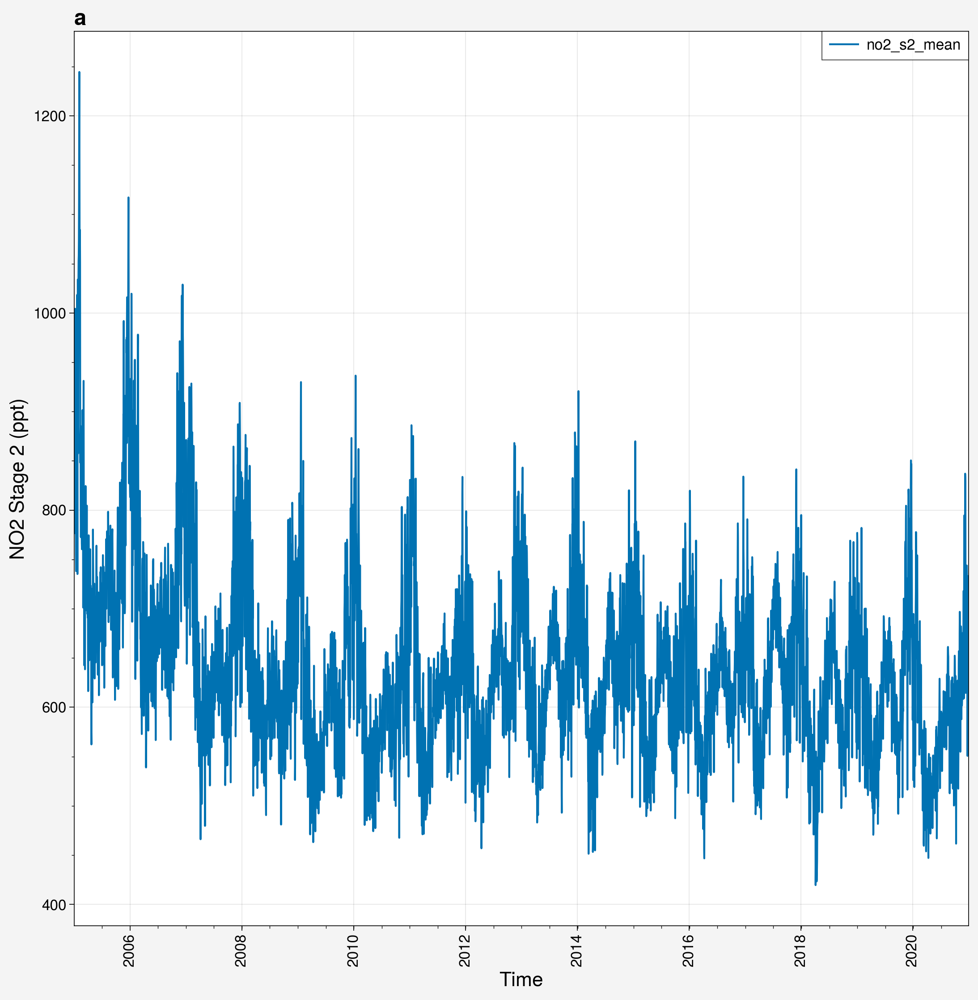

In [3]:
from unox.plotting import plot_time_series

this_plt = plot_time_series(
    'no2_2005_2020',
    ['no2_s2'],
    ['mean'],
    is_input_set=True
)

In [ ]:
from unox.input import make_input_file 

make_input_file(
    name='input_refactor1',
    target_var='no2',
    start_date='2005-01-01',
    end_date='2020-12-31',
)

Loading ds_emiss
Time taken to interpolate ds_emiss: 0 days 00:00:19.078637
Loading ds_chemra
Processing ds_chemra file /data/high_res/emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_2hr_no2_sfc_2005.nc, year 2005
Processing ds_chemra file /data/high_res/emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_2hr_no2_sfc_2006.nc, year 2006
Processing ds_chemra file /data/high_res/emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_2hr_no2_sfc_2007.nc, year 2007
Processing ds_chemra file /data/high_res/emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_2hr_no2_sfc_2008.nc, year 2008
Processing ds_chemra file /data/high_res/emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_2hr_no2_sfc_2009.nc, year 2009
Processing ds_chemra file /data/high_res/emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_2hr_no2_sfc_2010.nc, year 2010
Processing ds_chemra file /data/high_res/emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_2hr_no2_sfc_2011.nc, year 2011
Processing ds_chemra file /data

<xarray.Dataset> Size: 3GB
Dimensions:  (lat: 56, lon: 120, time: 5844)
Coordinates:
  * lat      (lat) float32 224B 11.78 12.9 14.02 15.14 ... 71.21 72.34 73.46
  * lon      (lon) float32 480B -174.4 -173.2 -172.1 ... -42.75 -41.62 -40.5
  * time     (time) datetime64[ns] 47kB 2005-01-01 2005-01-02 ... 2020-12-31
Data variables:
    nox      (time, lat, lon) float32 157MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    no2      (time, lat, lon) float32 157MB 18.93 22.95 35.35 ... 52.99 54.24
    blh      (time, lat, lon) float64 314MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    lsm      (time, lat, lon) float64 314MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    skt      (time, lat, lon) float64 314MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    sp       (time, lat, lon) float64 314MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    ssrd     (time, lat, lon) float64 314MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    t2m      (time, lat, lon) float64 314MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    u10      (time, lat, lon) float64 314MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    v10      (time, lat, lon) float64 314MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    no2_tm1  (time, lat, lon) float32 157MB nan nan nan nan ... 17.11 15.69 14.0
Attributes: (12/17)
    name:                        input_refactor1
    y_var:                       nox
    x_vars:                      ['no2', 'no2_tm1', 'u10', 'v10', 'blh', 'sp'...
    start_date:                  2005-01-01
    end_date:                    2020-12-31
    stage_2:                     1
    ...                          ...
    stage_2_original_type:       bool
    attrs_emiss_original_type:   dict
    attrs_chemra_original_type:  dict
    attrs_met_original_type:     dict
    modification_date:           2026-03-24 19:30:10
    description:                 Input data for the Unet model.

Shape of no2_s2 from no2_2005-2020: (364, 56, 120)
Shape of no2_s2 from no2_2005_2020: (364, 56, 120)
The input files are similar within the absolute tolerance of 2e-05
Number of differences: 260700 / 2446080 ( 10.657868916797488 % )


/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "


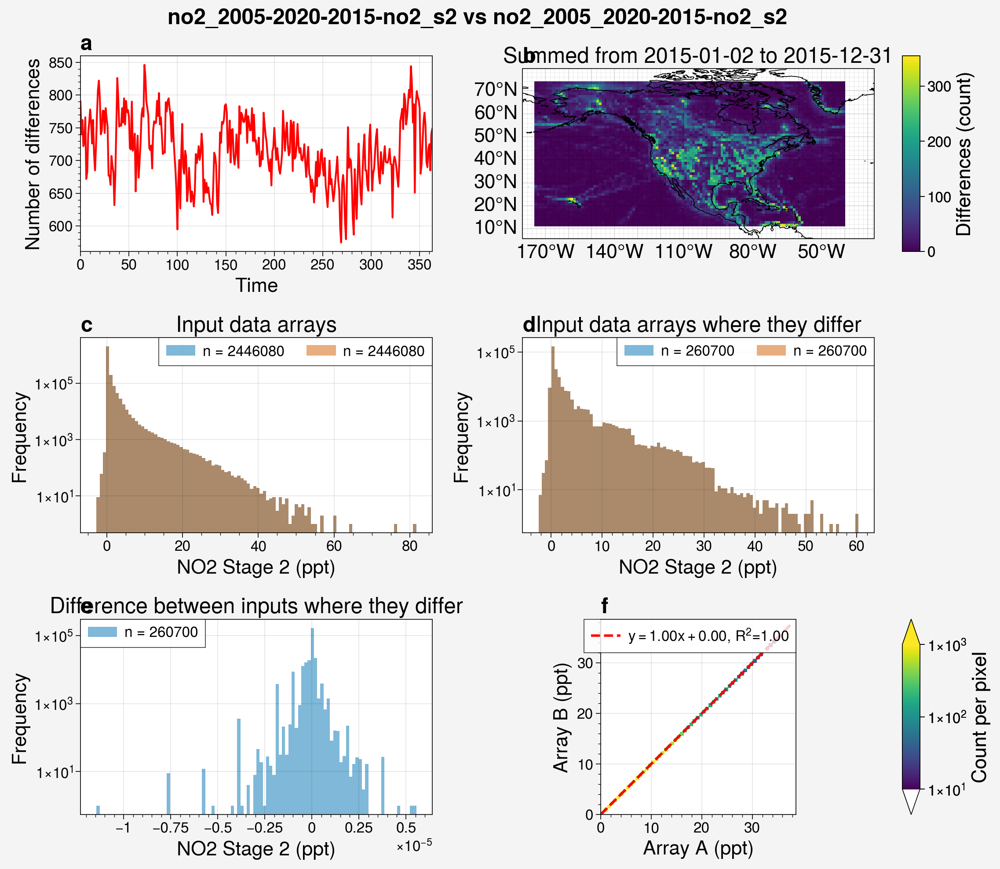

In [5]:
from unox.plotting import compare_input_vars

this_var = 'no2_s2'
this_year = 2015

input_comparison = compare_input_vars(
    {
        'input_set': 'no2_2005-2020',
        'version': 'old',
        # 'input_set': 'input_refactor9',
        # 'version': 'new',
        'year': this_year,
        'var': this_var,
    },
    {
        # 'input_set': 'no2_2005-2020',
        # 'version': 'old',
        'input_set': 'no2_2005_2020',
        'version': 'new',
        'year': this_year,
        'var': this_var,
    },
    # restrict_lat_lon_to='../datafiles/sample_data/nox_2019_t106_US.nc',
)

/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/proplot/__init__.py:6: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources as pkg


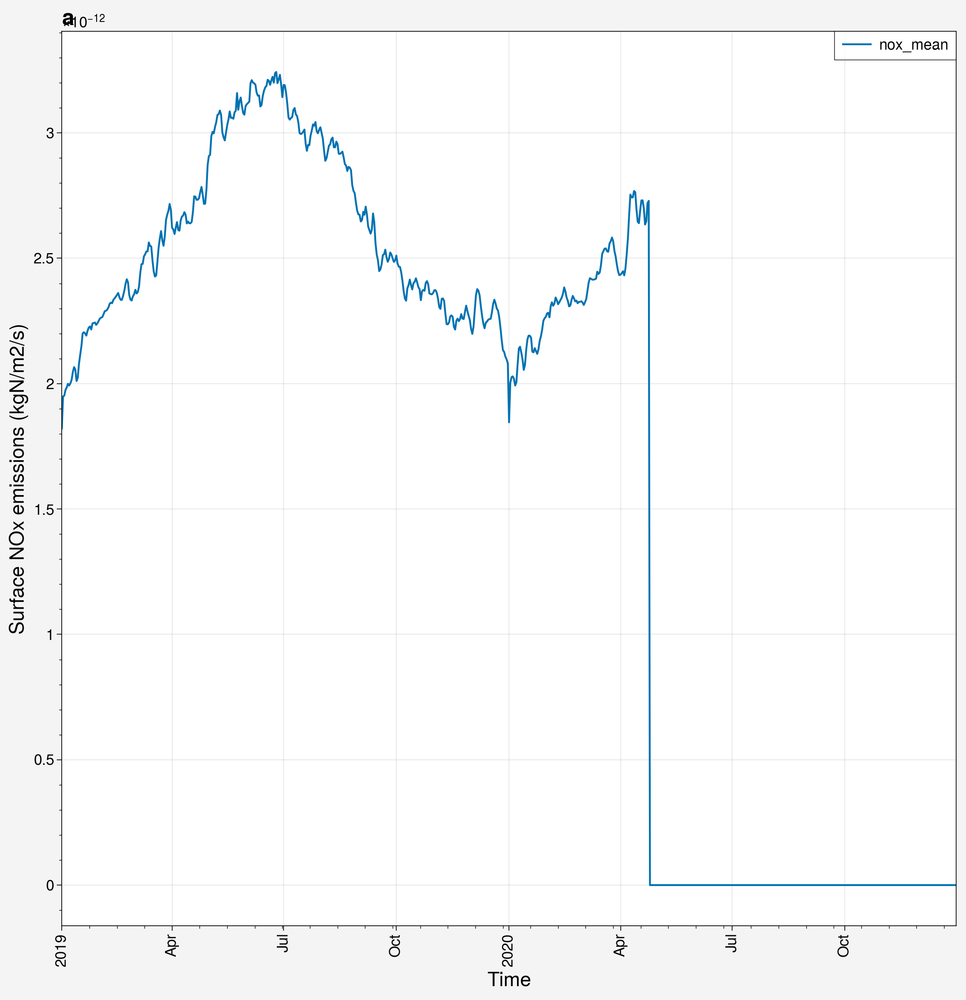

In [ ]:
from unox.plotting import plot_time_series

this_plt = plot_time_series(
    'input_refactor3',
    ['nox'],
    ['mean'],
    is_input_set=True
)

/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/proplot/__init__.py:6: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources as pkg
/home/mschee/unox/src/unox/HPC/data0/dataset.py:480: UserWarning: (is_ensemble) `dataset` must be a prediction set to check for ensemble members.
  warnings.warn(f"(is_ensemble) `dataset` must be a prediction set to check for ensemble members.")
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keywor

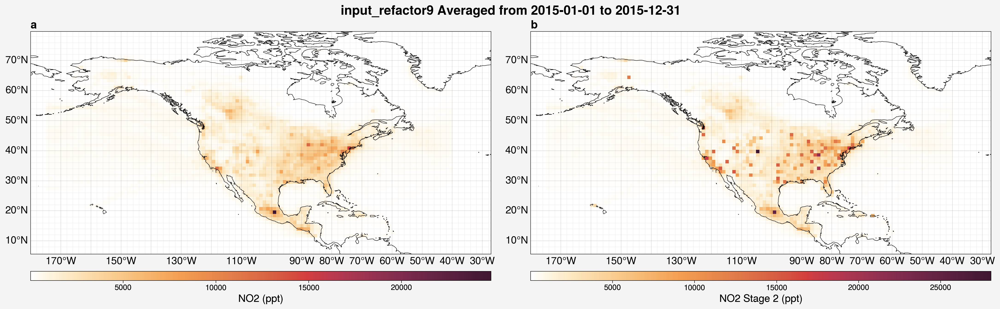

In [2]:
from unox.plotting import plot_var_maps

var_plots = plot_var_maps(
    'input_refactor9',
    is_input_set=True,
    vars = ['no2', 'no2_s2'],
    datetime='2019-01-01',
)

In [ ]:
from unox.input import make_input_file 

make_input_file(
    name='input_refactor1',
    target_var='no2',
    start_date='2015-01-01',
    end_date='2015-12-31',
)

Loading ds_emiss
Loading ds_chemra
Processing ds_chemra file ['/data/high_res/emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_2hr_no2_sfc_2015.nc'], year 2015
	January 1st, None not present in xr_dataset
Loading ds_era5
Merging datasets


<xarray.Dataset> Size: 186MB
Dimensions:  (time: 365, lat: 56, lon: 120)
Coordinates:
  * lat      (lat) float32 224B 11.78 12.9 14.02 15.14 ... 71.21 72.34 73.46
  * lon      (lon) float32 480B -174.4 -173.2 -172.1 ... -42.75 -41.62 -40.5
  * time     (time) datetime64[ns] 3kB 2015-01-01 2015-01-02 ... 2015-12-31
Data variables:
    nox      (time, lat, lon) float32 10MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    no2      (time, lat, lon) float32 10MB 28.04 27.56 26.88 ... 9.159 9.077
    no2_tm1  (time, lat, lon) float32 10MB 0.0 0.0 0.0 0.0 ... 10.8 11.27 11.47
    blh      (time, lat, lon) float64 20MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    lsm      (time, lat, lon) float64 20MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    skt      (time, lat, lon) float64 20MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    sp       (time, lat, lon) float64 20MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    ssrd     (time, lat, lon) float64 20MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    t2m      (time, lat, lon) float64 20MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    u10      (time, lat, lon) float64 20MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
    v10      (time, lat, lon) float64 20MB dask.array<chunksize=(1, 56, 120), meta=np.ndarray>
Attributes:
    name:               input_refactor1
    y_var:              nox
    x_vars:             ['no2', 'no2_tm1', 'u10', 'v10', 'blh', 'sp', 'skt', ...
    start_date:         2015-01-01
    end_date:           2015-12-31
    stage_2:            True
    stage_2_cutoff:     2013
    nan_fill:           0
    attrs_emiss:        {}
    attrs_chemra:       {'CDI': 'Climate Data Interface version 1.9.10 (https...
    attrs_era5:         {'GRIB_centre': 'ecmf', 'GRIB_centreDescription': 'Eu...
    modification_date:  2026-03-24 10:08:24

In [ ]:
import xarray as xr

emiss_files = ['/data/high_res/emacdonald/unet/datafiles/t106/nox_2015_t106_US.nc',
 '/data/high_res/emacdonald/unet/datafiles/t106/nox_2016_t106_US.nc',
 '/data/high_res/emacdonald/unet/datafiles/t106/nox_2017_t106_US.nc',
 '/data/high_res/emacdonald/unet/datafiles/t106/nox_2018_t106_US.nc',
 '/data/high_res/emacdonald/unet/datafiles/t106/nox_2019_t106_US.nc',
 '/data/high_res/emacdonald/unet/datafiles/t106/nox_2020_t106_US.nc'
]

chemra_files = ['/data/high_res/emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_2hr_no2_sfc_2015.nc',
  '/data/high_res/emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_2hr_no2_sfc_2016.nc',
  '/data/high_res/emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_2hr_no2_sfc_2017.nc',
  '/data/high_res/emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_2hr_no2_sfc_2018.nc',
  '/data/high_res/emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_2hr_no2_sfc_2019.nc',
  '/data/high_res/emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_2hr_no2_sfc_2020.nc'
]

insitu_files = ['/data/high_res/US_EPA/NO2/daily_NO2/daily_42602_2015.csv',
  '/data/high_res/US_EPA/NO2/daily_NO2/daily_42602_2016.csv',
  '/data/high_res/US_EPA/NO2/daily_NO2/daily_42602_2017.csv',
  '/data/high_res/US_EPA/NO2/daily_NO2/daily_42602_2018.csv',
  '/data/high_res/US_EPA/NO2/daily_NO2/daily_42602_2019.csv',
  '/data/high_res/US_EPA/NO2/daily_NO2/daily_42602_2020.csv'
]

era5_files = ['/data/high_res/ERA5concatenated/2015u10.nc',
  '/data/high_res/ERA5concatenated/2015v10.nc',
  '/data/high_res/ERA5concatenated/2015blh.nc',
  '/data/high_res/ERA5concatenated/2015sp.nc',
  '/data/high_res/ERA5concatenated/2015skt.nc',
  '/data/high_res/ERA5concatenated/2015t2m.nc',
  '/data/high_res/ERA5concatenated/2015ssrd.nc',
  '/data/high_res/ERA5concatenated/2015lsm.nc',
  '/data/high_res/ERA5concatenated/2016u10.nc',
  '/data/high_res/ERA5concatenated/2016v10.nc',
  '/data/high_res/ERA5concatenated/2016blh.nc',
  '/data/high_res/ERA5concatenated/2016sp.nc',
  '/data/high_res/ERA5concatenated/2016skt.nc',
  '/data/high_res/ERA5concatenated/2016t2m.nc',
  '/data/high_res/ERA5concatenated/2016ssrd.nc',
  '/data/high_res/ERA5concatenated/2016lsm.nc',
  '/data/high_res/ERA5concatenated/2017u10.nc',
  '/data/high_res/ERA5concatenated/2017v10.nc',
  '/data/high_res/ERA5concatenated/2017blh.nc',
  '/data/high_res/ERA5concatenated/2017sp.nc',
  '/data/high_res/ERA5concatenated/2017skt.nc',
  '/data/high_res/ERA5concatenated/2017t2m.nc',
  '/data/high_res/ERA5concatenated/2017ssrd.nc',
  '/data/high_res/ERA5concatenated/2017lsm.nc',
  '/data/high_res/ERA5concatenated/2018u10.nc',
  '/data/high_res/ERA5concatenated/2018v10.nc',
  '/data/high_res/ERA5concatenated/2018blh.nc',
  '/data/high_res/ERA5concatenated/2018sp.nc',
  '/data/high_res/ERA5concatenated/2018skt.nc',
  '/data/high_res/ERA5concatenated/2018t2m.nc',
  '/data/high_res/ERA5concatenated/2018ssrd.nc',
  '/data/high_res/ERA5concatenated/2018lsm.nc',
  '/data/high_res/ERA5concatenated/2019u10.nc',
  '/data/high_res/ERA5concatenated/2019v10.nc',
  '/data/high_res/ERA5concatenated/2019blh.nc',
  '/data/high_res/ERA5concatenated/2019sp.nc',
  '/data/high_res/ERA5concatenated/2019skt.nc',
  '/data/high_res/ERA5concatenated/2019t2m.nc',
  '/data/high_res/ERA5concatenated/2019ssrd.nc',
  '/data/high_res/ERA5concatenated/2019lsm.nc',
  '/data/high_res/ERA5concatenated/2020u10.nc',
  '/data/high_res/ERA5concatenated/2020v10.nc',
  '/data/high_res/ERA5concatenated/2020blh.nc',
  '/data/high_res/ERA5concatenated/2020sp.nc',
  '/data/high_res/ERA5concatenated/2020skt.nc',
  '/data/high_res/ERA5concatenated/2020t2m.nc',
  '/data/high_res/ERA5concatenated/2020ssrd.nc',
  '/data/high_res/ERA5concatenated/2020lsm.nc'
]

xr.open_dataset(emiss_files[0])

<xarray.Dataset> Size: 897MB
Dimensions:    (time: 4380, nv: 2, lon: 320, lat: 160)
Coordinates:
  * time       (time) datetime64[ns] 35kB 2005-01-01 ... 2005-12-31T22:00:00
  * lon        (lon) float32 1kB 0.0 1.125 2.25 3.375 ... 356.6 357.8 358.9
  * lat        (lat) float32 640B -89.14 -88.03 -86.91 ... 86.91 88.03 89.14
Dimensions without coordinates: nv
Data variables:
    time_bnds  (time, nv) datetime64[ns] 70kB ...
    lon_bnds   (lon, nv) float32 3kB ...
    lat_bnds   (lat, nv) float32 1kB ...
    no2        (time, lat, lon) float32 897MB ...
Attributes: (12/25)
    CDI:                            Climate Data Interface version 1.9.10 (ht...
    Conventions:                    CF-1.6
    source:                         Tropospheric Chemistry Reanalysis v2
    institution:                    Jet Propulsion Laboratory
    ShortName:                      TRPSCRNO22H2D
    LongName:                       TROPESS Chemical Reanalysis Surface NO2 2...
    ...                             ...
    IdentifierProductDOI:           10.5067/5FC44ZMSOGB6
    IdentifierProductDOIAuthority:  https://doi.org/
    references:                     https://essd.copernicus.org/articles/12/2...
    ProcessingLevel:                4
    MeasuredParameter:              NO2
    history:                        2023-01-27T12:07:00Z: Reformatted with CF...

In [ ]:
from unox.plotting import compare_input_vars

input_comparison = compare_input_vars(
    {
        'input_set': 'input_refactor0',
        'year': 2019,
        'var': 'no2',
    },
    {
        'input_set': 'no2_2005-2020',
        'year': 2019,
        'var': 'no2',
    },
    # restrict_lat_lon_to='../datafiles/sample_data/nox_2019_t106_US.nc',
)

Shape of no2 from input_refactor0: (364, 56, 120)
Shape of no2 from no2_2005-2020: (364, 56, 120)
Match found for input_refactor0-2019-no2 vs no2_2005-2020-2019-no2.


Shape of no2 from no2_2005-2020: (364, 56, 120)
Shape of no2 from input_refactor2: (364, 56, 120)
The input files differ more than the tolerance of 2e-05
Number of differences: 2446080 / 2446080 ( 100.0 % )


/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "


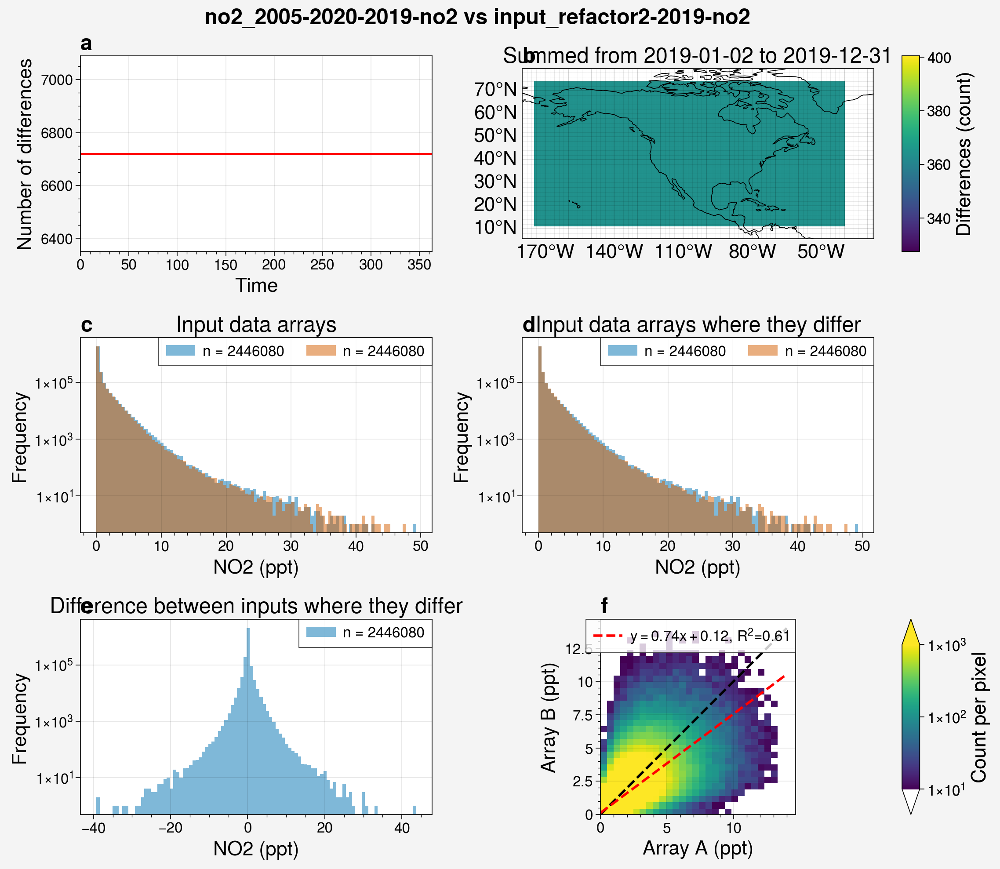

In [ ]:
from unox.plotting import compare_input_vars

this_var = 'no2'
this_year = 2019

input_comparison = compare_input_vars(
    {
        'input_set': 'no2_2005-2020',
        'year': this_year,
        'var': this_var,
    },
    {
        'input_set': 'input_refactor2',
        'year': this_year,
        'var': this_var,
    },
    # restrict_lat_lon_to='../datafiles/sample_data/nox_2019_t106_US.nc',
)

In [ ]:
import xarray as xr
import numpy as np
import cftime

# Two input files to compare
input_a = xr.open_dataset('inputfiles/input_refactor1/input_refactor1.nc')
input_b = xr.open_dataset('inputfiles/no2_2005-2020/no2_2005-2020.nc')

# Keep only the years 2017, 2018, and 2019 from both datasets
input_a = input_a.sel(time=slice('2017-01-01', '2019-12-31'))
input_b = input_b.sel(time=slice('2017-01-01', '2019-12-31'))

# Keep only the `no2` variable from both datasets
input_a = input_a[['no2']]
input_b = input_b[['no2']]

# Scale input a by 1e-3
input_a['no2'] = input_a['no2'] * 1e-3

# Remove January 1st every year from input a, if it exists
if 'time' in input_a.coords:
    for year in range(2017, 2020):
        jan_1 = np.datetime64(f"{year}-01-01")
        if jan_1 in input_a.coords['time']:
            input_a = input_a.drop_sel(time=jan_1)

# Keep only the days between the start and end
start_date = '2019-01-02'
end_date = '2019-01-02'
input_a = input_a.sel(time=slice(start_date, end_date))
input_b = input_b.sel(time=slice(start_date, end_date))

# Print out the average and standard deviation of the data arrays
print(f"Input A (input_refactor1): mean={input_a['no2'].mean().item()}, std={input_a['no2'].std().item()}")
print(f"Input B (no2_2005-2020): mean={input_b['no2'].mean().item()}, std={input_b['no2'].std().item()}")

# Compare the arrays
if np.array_equal(input_a['no2'], input_b['no2']):
    print("The no2 data arrays for are exactly equal.")
elif np.allclose(input_a['no2'], input_b['no2'], atol=1e-6):
    print("The no2 data arrays for are approximately equal.")
else:
    print("The no2 data arrays for are NOT approximately equal.")

Input A (input_refactor1): mean=0.5158961415290833, std=1.1710132360458374
Input B (no2_2005-2020): mean=0.5158961694362959, std=1.1710132591791336
The no2 data arrays for are approximately equal.


In [ ]:
import xarray as xr

# xr.open_dataset('/data/ctm/ExtData/GEOS_2x2.5/MERRA2/2019/01/MERRA2.20190120.A1.2x25.nc4')
xr.open_dataset('/data/high_res/emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_2hr_no2_sfc_2015.nc')

<xarray.Dataset> Size: 897MB
Dimensions:    (time: 4380, nv: 2, lon: 320, lat: 160)
Coordinates:
  * time       (time) datetime64[ns] 35kB 2005-01-01 ... 2005-12-31T22:00:00
  * lon        (lon) float32 1kB 0.0 1.125 2.25 3.375 ... 356.6 357.8 358.9
  * lat        (lat) float32 640B -89.14 -88.03 -86.91 ... 86.91 88.03 89.14
Dimensions without coordinates: nv
Data variables:
    time_bnds  (time, nv) datetime64[ns] 70kB ...
    lon_bnds   (lon, nv) float32 3kB ...
    lat_bnds   (lat, nv) float32 1kB ...
    no2        (time, lat, lon) float32 897MB ...
Attributes: (12/25)
    CDI:                            Climate Data Interface version 1.9.10 (ht...
    Conventions:                    CF-1.6
    source:                         Tropospheric Chemistry Reanalysis v2
    institution:                    Jet Propulsion Laboratory
    ShortName:                      TRPSCRNO22H2D
    LongName:                       TROPESS Chemical Reanalysis Surface NO2 2...
    ...                             ...
    IdentifierProductDOI:           10.5067/5FC44ZMSOGB6
    IdentifierProductDOIAuthority:  https://doi.org/
    references:                     https://essd.copernicus.org/articles/12/2...
    ProcessingLevel:                4
    MeasuredParameter:              NO2
    history:                        2023-01-27T12:07:00Z: Reformatted with CF...

In [ ]:
import pandas as pd

insitu_filepath = '/data/high_res/US_EPA/NO2/daily_NO2/daily_42602_2015.csv'

insitu_units = pd.read_csv(insitu_filepath, usecols=['Units of Measure'])
# Verify that all the values in the `Units of Measure` column are the same
unique_units = insitu_units['Units of Measure'].unique()
if len(unique_units) > 1:
    raise ValueError(f"Multiple units of measure found in the insitu data: {unique_units}")
else:
    insitu_units = unique_units[0]
# insitu_units

# List of columns to use for global attributes
global_attr_cols = ['Parameter Name', 'Sample Duration', 'Pollutant Standard']
insitu_global_attrs = pd.read_csv(insitu_filepath, usecols=global_attr_cols)
# Verify that there is only one unique value for each of the global attribute columns
for col in global_attr_cols:
    unique_values = insitu_global_attrs[col].unique()
    if len(unique_values) > 1:
        print(f"Multiple unique values found in column '{col}' of the insitu data: {unique_values}. Using the first value for the global attribute.")
    insitu_global_attrs[col] = unique_values[0]
# Convert the global attributes to a dictionary    
insitu_global_attrs_dict = insitu_global_attrs.iloc[0].to_dict()
insitu_global_attrs_dict

{'Parameter Name': 'Nitrogen dioxide (NO2)',
 'Sample Duration': '1 HOUR',
 'Pollutant Standard': 'NO2 1-hour 2010'}

---

# Plotting functions

/home/mschee/unox/src/unox/HPC/data0/dataset.py:480: UserWarning: (is_ensemble) `dataset` must be a prediction set to check for ensemble members.
  warnings.warn(f"(is_ensemble) `dataset` must be a prediction set to check for ensemble members.")
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "


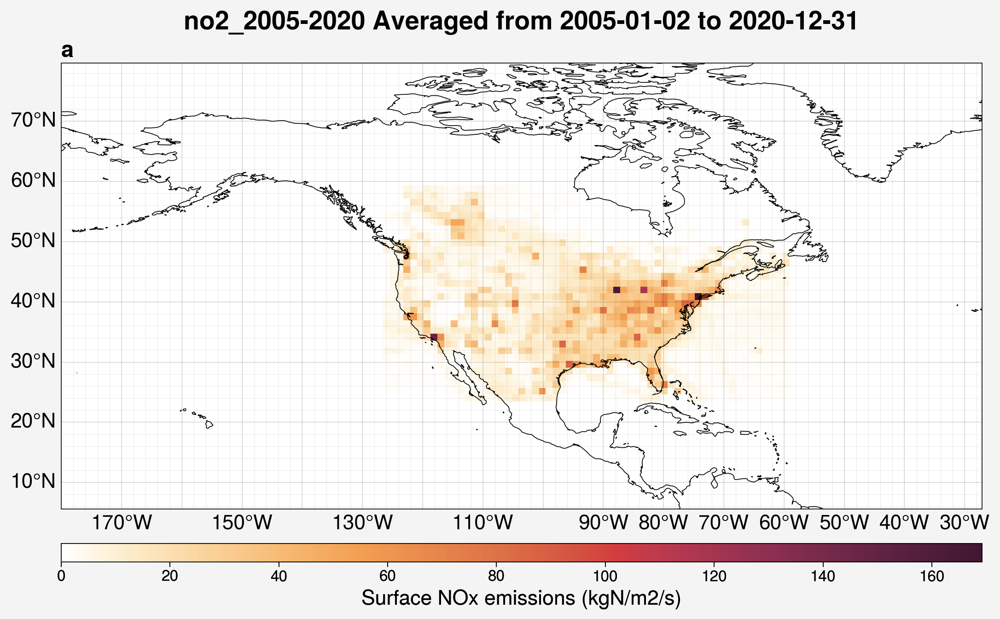

In [7]:
from unox.plotting import plot_var_maps

var_plots = plot_var_maps(
    'no2_2005-2020',
    is_input_set=True,
    vars = ['nox'],
    datetime='2019-01-01',
)

/home/mschee/unox/src/unox/HPC/data0/dataset.py:480: UserWarning: (is_ensemble) `dataset` must be a prediction set to check for ensemble members.
  warnings.warn(f"(is_ensemble) `dataset` must be a prediction set to check for ensemble members.")
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "


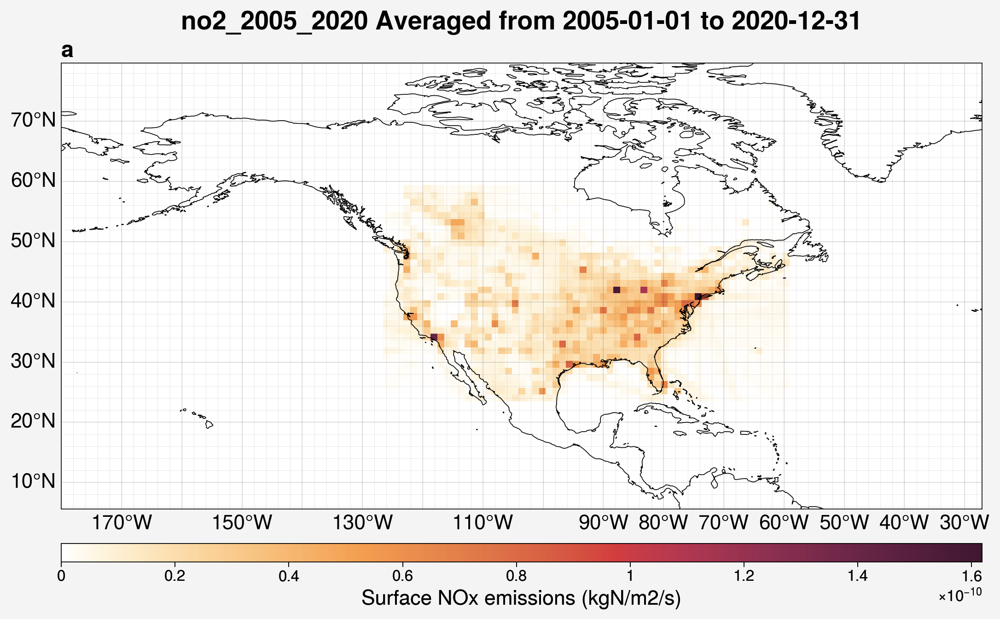

In [8]:
from unox.plotting import plot_var_maps

var_plots = plot_var_maps(
    'no2_2005_2020',
    is_input_set=True,
    vars = ['nox'],
    datetime='2019-01-01',
)

/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "


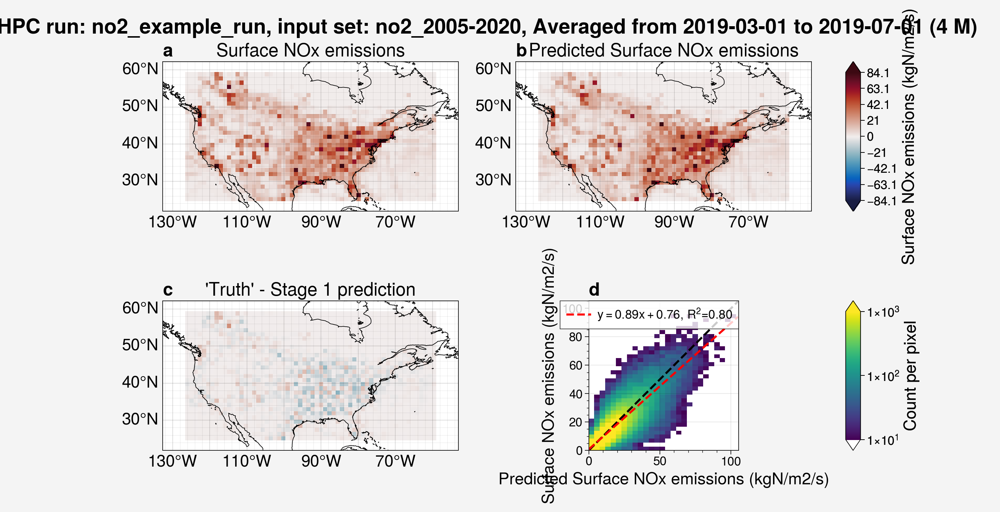

In [ ]:
from unox.plotting import plot_run_analysis

this_plt = plot_run_analysis(
    'no2_example_run',
    start_date='2019-03-01',
    interval='4M',
    restrict_lat_lon_to='datafiles/sample_data/nox_2019_t106_US.nc',
    stage1_only=True,
)

In [ ]:
from unox.HPC.data0.dataset import uarray 

no2_ex_uarr = uarray('no2_example_run', is_predict=True)
no2_ex_uarr.xr.attrs['input_set'] = 'no2_2019_JFM'
no2_ex_uarr._get_metadata()
no2_ex_uarr.metadata['config_dict']['input_set'] = 'no2_2019_JFM'
no2_ex_uarr.xr = no2_ex_uarr.xr.sel(time=slice("2019-01-01", "2019-03-31"))
no2_ex_uarr.xr

<xarray.Dataset> Size: 5MB
Dimensions:      (time: 89, lat: 56, lon: 120)
Coordinates:
  * time         (time) object 712B 2019-01-02 00:00:00 ... 2019-03-31 00:00:00
  * lat          (lat) float32 224B 11.78 12.9 14.02 15.14 ... 71.21 72.34 73.46
  * lon          (lon) float32 480B -174.4 -173.2 -172.1 ... -42.75 -41.62 -40.5
Data variables:
    nox_pred     (time, lat, lon) float32 2MB ...
    nox_pred_s2  (time, lat, lon) float32 2MB ...
Attributes: (12/18)
    description:        Predicted Surface NOx emissions using a U-net model
    modification_date:  2026-01-21 16:32:09
    y_var:              nox
    input_set:          no2_2019_JFM
    config_path:        inputfiles/_input_configs/sample_config.json
    config_dict:        {'input_set': 'no2_2005-2020', 'x_vars': ['no2', 'no2...
    ...                 ...
    x_vars:             ['no2', 'no2_tm1', 'u10', 'v10', 'blh', 'sp', 'skt', ...
    data_dir:           /data/high_res
    chemra_path:        emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_...
    insitu_path:        US_EPA/NO2/daily_NO2/daily_42602_
    era5_path:          ERA5concatenated
    stages:             [1 2]

In [ ]:
no2_ex_uarr.is_predict

True

/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/proplot/__init__.py:6: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources as pkg
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `m

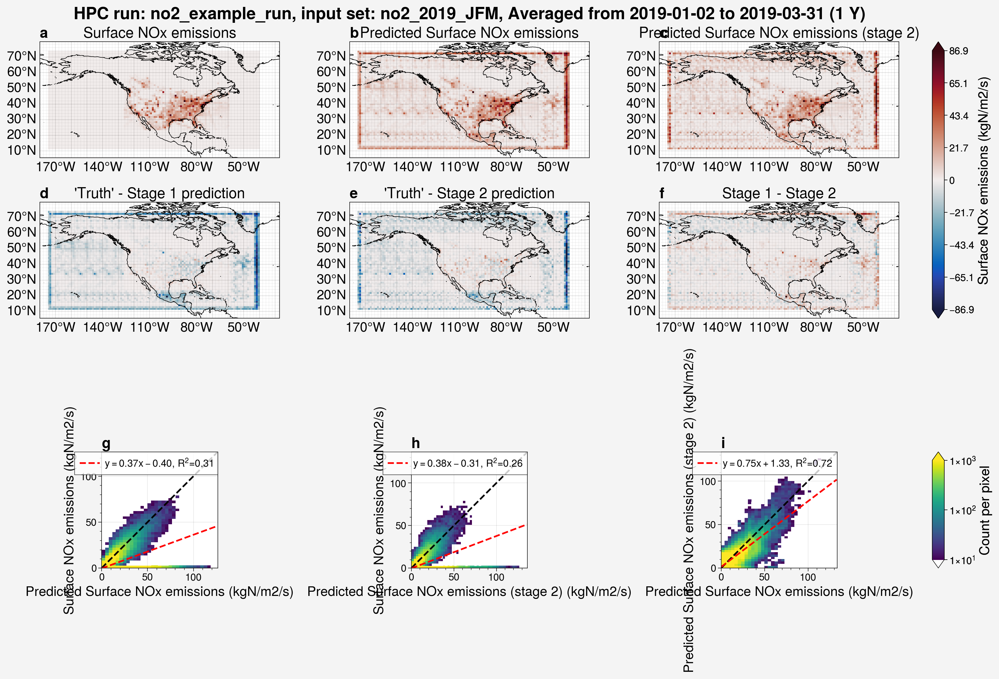

In [ ]:
from unox.plotting import plot_run_analysis

this_plt = plot_run_analysis(
    no2_ex_uarr,
)

In [ ]:
from unox.HPC.data0.dataset import uarray 

this_uarr = uarray('no2_example_run', is_predict=True)
these_logs = this_uarr._get_epochs_logs()
these_logs

<xarray.Dataset> Size: 26kB
Dimensions:         (epoch: 250, stage: 2)
Coordinates:
  * epoch           (epoch) int64 2kB 0 1 2 3 4 5 6 ... 244 245 246 247 248 249
  * stage           (stage) int64 16B 1 2
Data variables:
    loss            (stage, epoch) float64 4kB 77.48 55.67 46.05 ... 5.599 5.623
    msenonzero      (stage, epoch) float64 4kB 77.48 55.67 46.05 ... 5.599 5.623
    r2_keras        (stage, epoch) float64 4kB 0.2418 0.4556 ... 0.9293 0.929
    val_loss        (stage, epoch) float64 4kB 66.97 51.44 44.8 ... 7.096 6.998
    val_msenonzero  (stage, epoch) float64 4kB 66.97 51.44 44.8 ... 7.096 6.998
    val_r2_keras    (stage, epoch) float64 4kB 0.3651 0.5124 ... 0.9085 0.9097

/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/proplot/__init__.py:6: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources as pkg


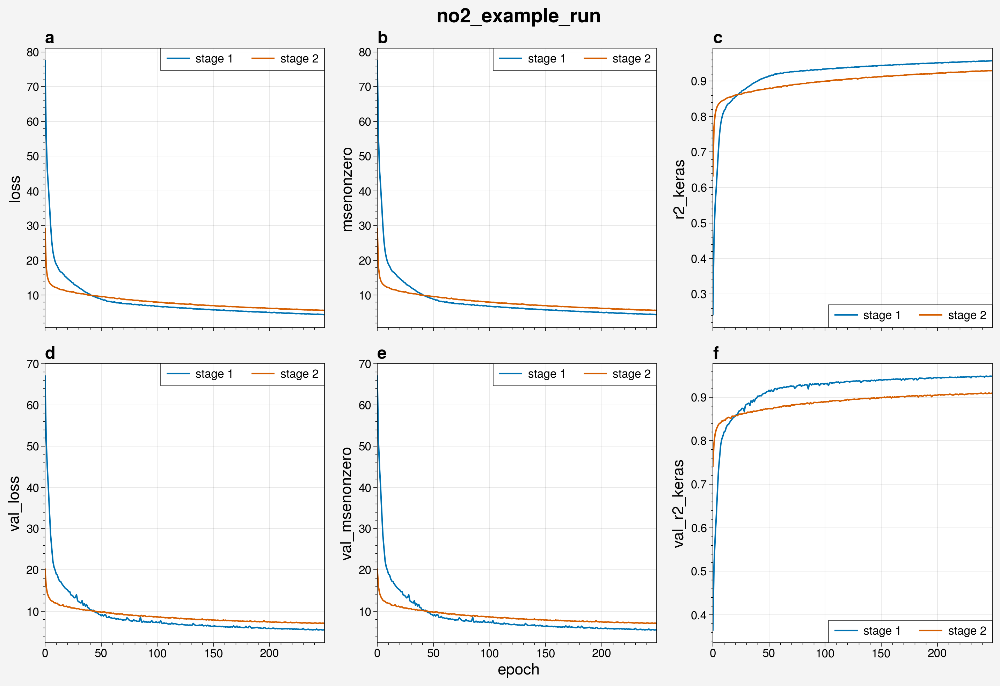

In [ ]:
from unox.plotting import plot_epochs_logs 

this_plot = plot_epochs_logs(
    'no2_example_run',
    is_predict=True,
)

In [ ]:
import xarray as xr

xr.open_dataset("HPC_runs/test_ens/predictions.nc")

<xarray.Dataset> Size: 196MB
Dimensions:         (time: 728, lat: 56, lon: 120)
Coordinates:
  * time            (time) object 6kB 2019-01-02 00:00:00 ... 2020-12-31 00:0...
  * lat             (lat) float32 224B 11.78 12.9 14.02 ... 71.21 72.34 73.46
  * lon             (lon) float32 480B -174.4 -173.2 -172.1 ... -41.62 -40.5
Data variables:
    nox_pred_01     (time, lat, lon) float32 20MB ...
    nox_pred_s2_01  (time, lat, lon) float32 20MB ...
    nox_pred_02     (time, lat, lon) float32 20MB ...
    nox_pred_s2_02  (time, lat, lon) float32 20MB ...
    nox_pred_03     (time, lat, lon) float32 20MB ...
    nox_pred_s2_03  (time, lat, lon) float32 20MB ...
    nox_pred_04     (time, lat, lon) float32 20MB ...
    nox_pred_s2_04  (time, lat, lon) float32 20MB ...
    nox_pred_05     (time, lat, lon) float32 20MB ...
    nox_pred_s2_05  (time, lat, lon) float32 20MB ...
Attributes: (12/19)
    description:        Predicted Surface NOx emissions using a U-net model
    modification_date:  2026-01-26 18:21:25
    y_var:              nox
    input_set:          no2_2005-2020
    config_path:        sample_config
    config_dict:        {'input_set': 'no2_2005-2020', 'x_vars': ['no2', 'no2...
    ...                 ...
    data_dir:           /data/high_res
    chemra_path:        emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_...
    insitu_path:        US_EPA/NO2/daily_NO2/daily_42602_
    era5_path:          ERA5concatenated
    stages:             [1 2]
    ensemble_size:      5

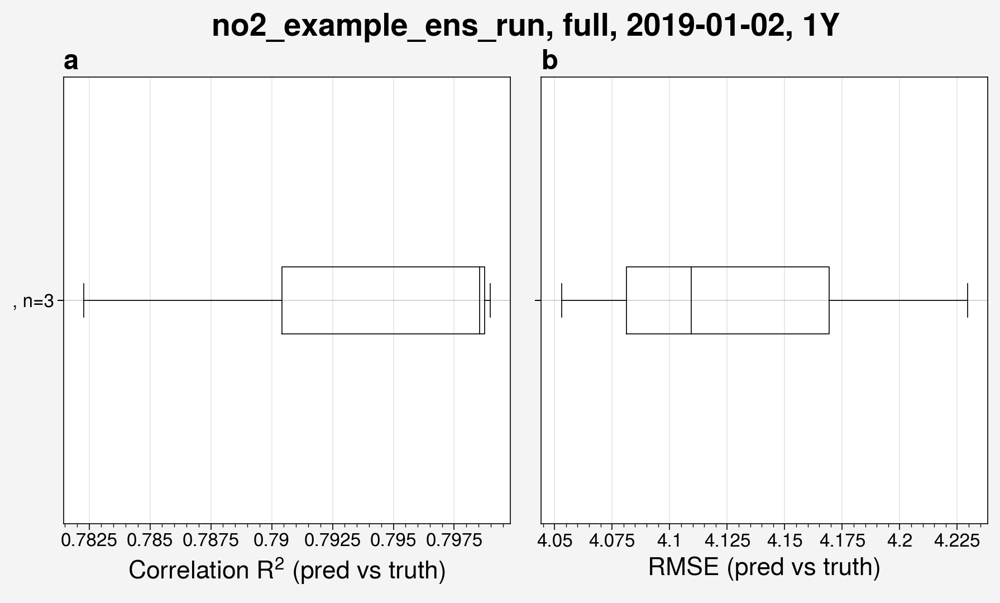

In [ ]:
from unox.plotting import plot_BaW 

this_plot = plot_BaW(
    ['R2', 'RMSE'],
    'no2_example_ens_run',
    # ['test_L21', 'test_ens1'],
    ds_kwargs=[
        {
            # 'label_note': "full lat-lon",
            'is_predict': True,
            'start_date': '2019-01-02',
            'interval': '1Y',
            # 'restrict_lat_lon_to': 'datafiles/sample_data/nox_2019_t106_US.nc',
        },
    ]
)

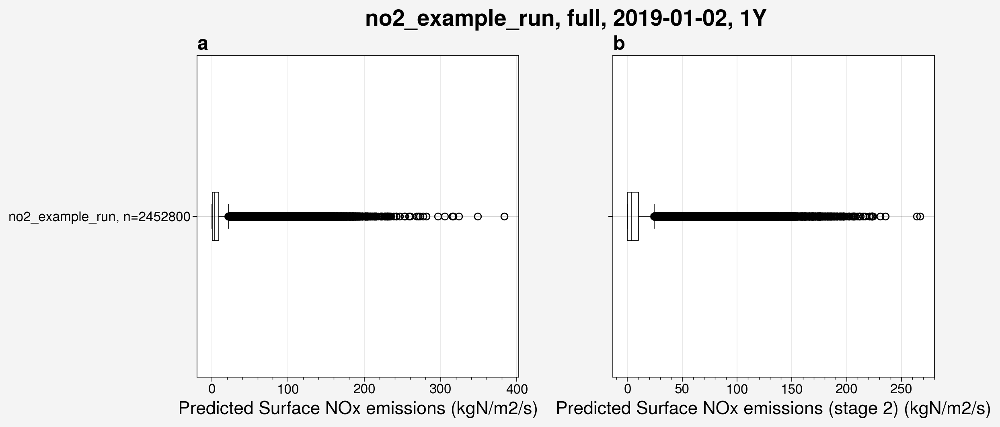

In [ ]:
from unox.plotting import plot_BaW 

this_plot = plot_BaW(
    ['nox_pred', 'nox_pred_s2'],
    'no2_example_run',
    # ['test_L21', 'test_ens1'],
    ds_kwargs=[
        {
            # 'label_note': "full lat-lon",
            'is_predict': True,
            'start_date': '2019-01-02',
            'interval': '1Y',
            # 'restrict_lat_lon_to': 'datafiles/sample_data/nox_2019_t106_US.nc',
        },
    ],
    # label_with=['size']
)

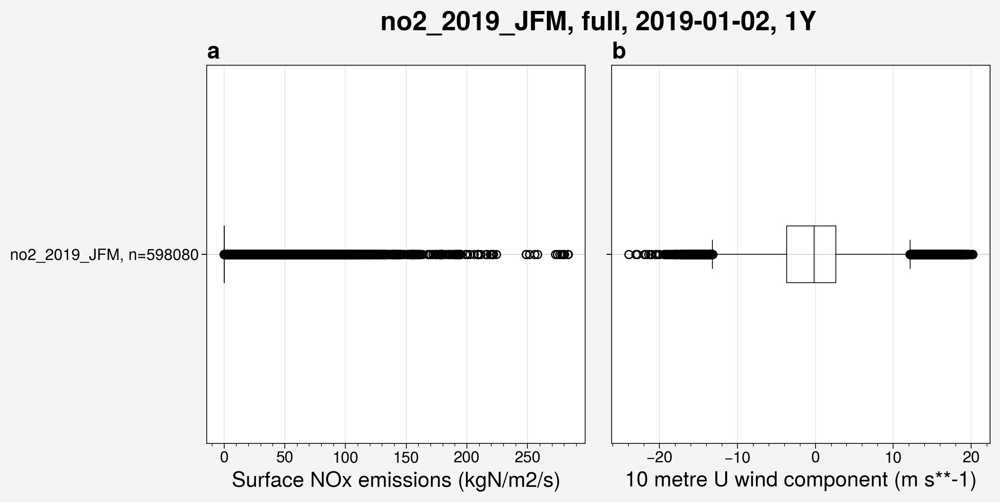

In [ ]:
from unox.plotting import plot_BaW 

this_plot = plot_BaW(
    ['nox', 'u10'],
    'no2_2019_JFM',
    # ['test_L21', 'test_ens1'],
    ds_kwargs=[
        {
            # 'label_note': "full lat-lon",
            'is_input_set': True,
            'start_date': '2019-01-02',
            'interval': '1Y',
            # 'restrict_lat_lon_to': 'datafiles/sample_data/nox_2019_t106_US.nc',
        },
    ],
    # label_with=['size']
)

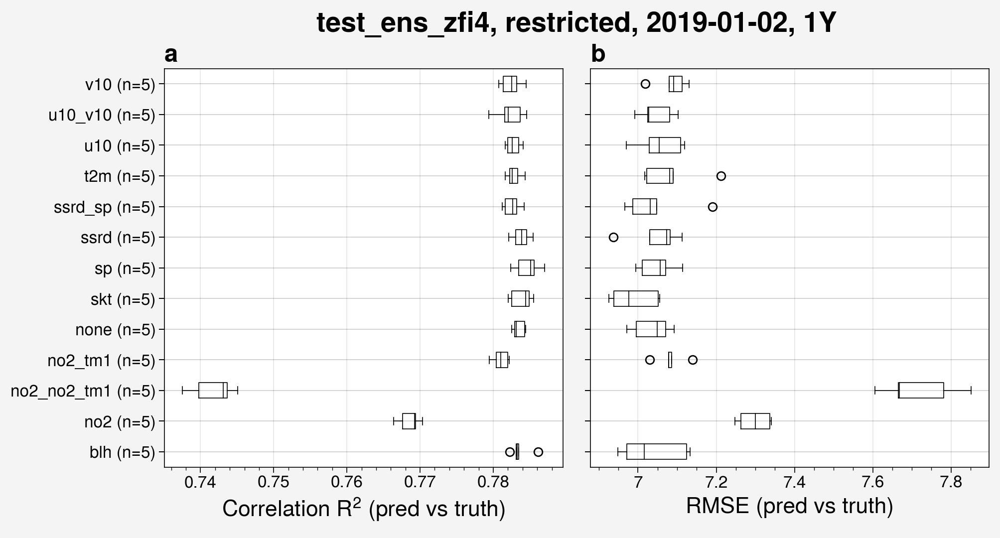

In [ ]:
from unox.plotting import plot_BaW 

this_plot = plot_BaW(
    ['R2', 'RMSE'],
    '_test_ens_zfi4',
    # ['test_L21', 'test_ens1'],
    ds_kwargs=[
        {
            # 'label_note': "full lat-lon",
            'is_predict': True,
            'start_date': '2019-01-02',
            'interval': '1Y',
            'restrict_lat_lon_to': 'datafiles/sample_data/nox_2019_t106_US.nc',
        },
    ]
)

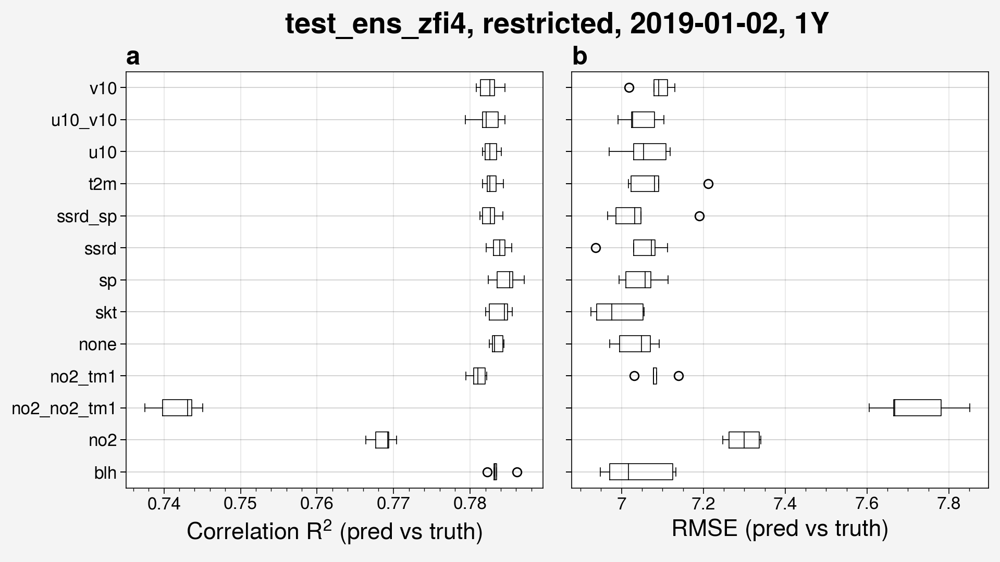

In [ ]:
from unox.plotting import plot_BaW 

this_plot = plot_BaW(
    ['R2', 'RMSE'],
    '_test_ens_zfi4',
    # ['test_L21', 'test_ens1'],
    ds_kwargs=[
        {
            # 'label_note': "full lat-lon",
            'is_predict': True,
            'start_date': '2019-01-02',
            'interval': '1Y',
            'restrict_lat_lon_to': 'datafiles/sample_data/nox_2019_t106_US.nc',
        },
    ],
    label_with = ['name']
)

/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/proplot/__init__.py:6: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources as pkg


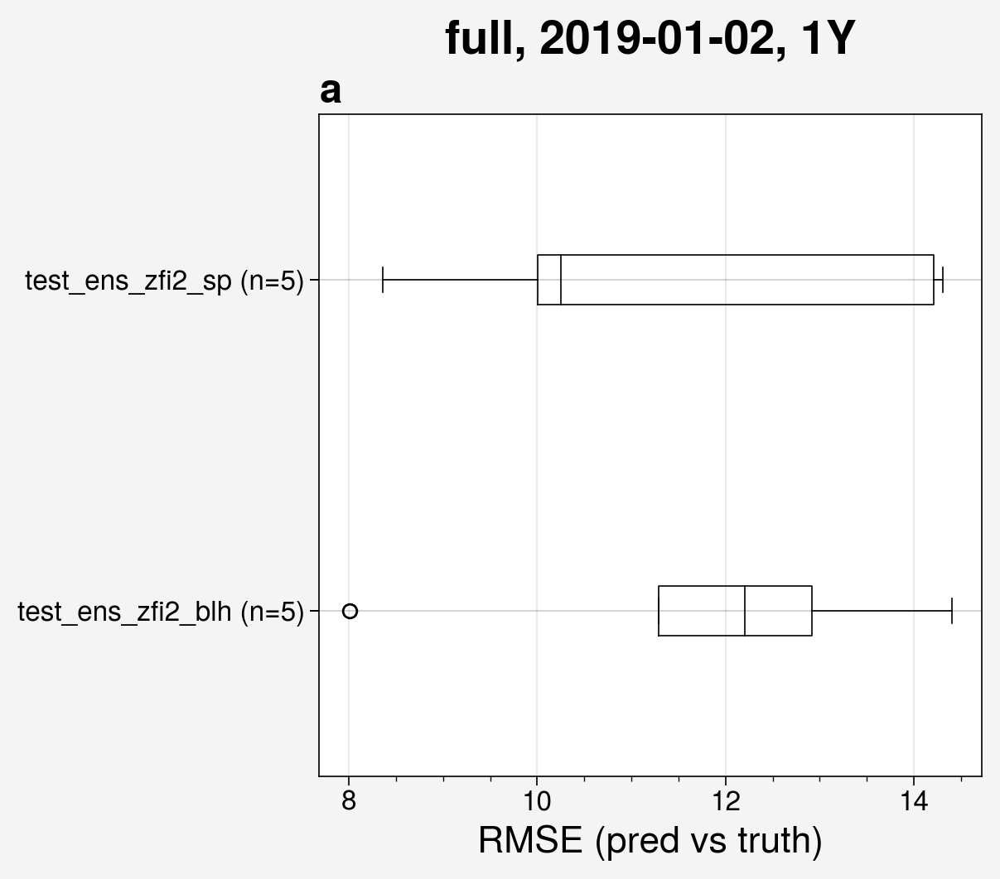

In [ ]:
from unox.plotting import plot_BaW 

this_plot = plot_BaW(
    'RMSE',
    ['_test_ens_zfi2/test_ens_zfi2_blh', '_test_ens_zfi2/test_ens_zfi2_sp'],
    ds_kwargs=[
        {
            # 'label_note': "full lat-lon",
            'is_predict': True,
            'start_date': '2019-01-02',
            'interval': '1Y',
        },
        # {
        #     # 'label_note': "lat-lon restricted",
        #     'is_predict': True,
        #     'start_date': '2019-01-02',
        #     'interval': '1Y',
        #     'restrict_lat_lon_to': 'datafiles/sample_data/nox_2019_t106_US.nc',
        # },
    ]
)

---

# Testing regularizer

/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/proplot/__init__.py:6: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources as pkg
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `m

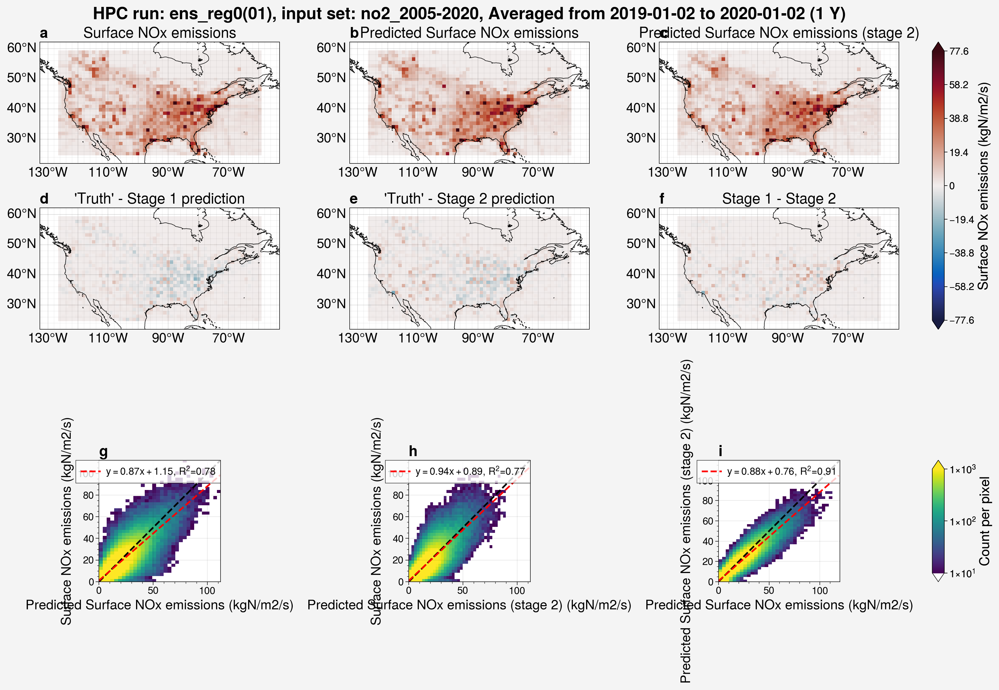

In [1]:
from unox.plotting import plot_run_analysis

var_plots = plot_run_analysis(
    'ens_reg0',
    ens_mem=1,
    restrict_lat_lon_to='datafiles/sample_data/nox_2019_t106_US.nc',
)

/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes i

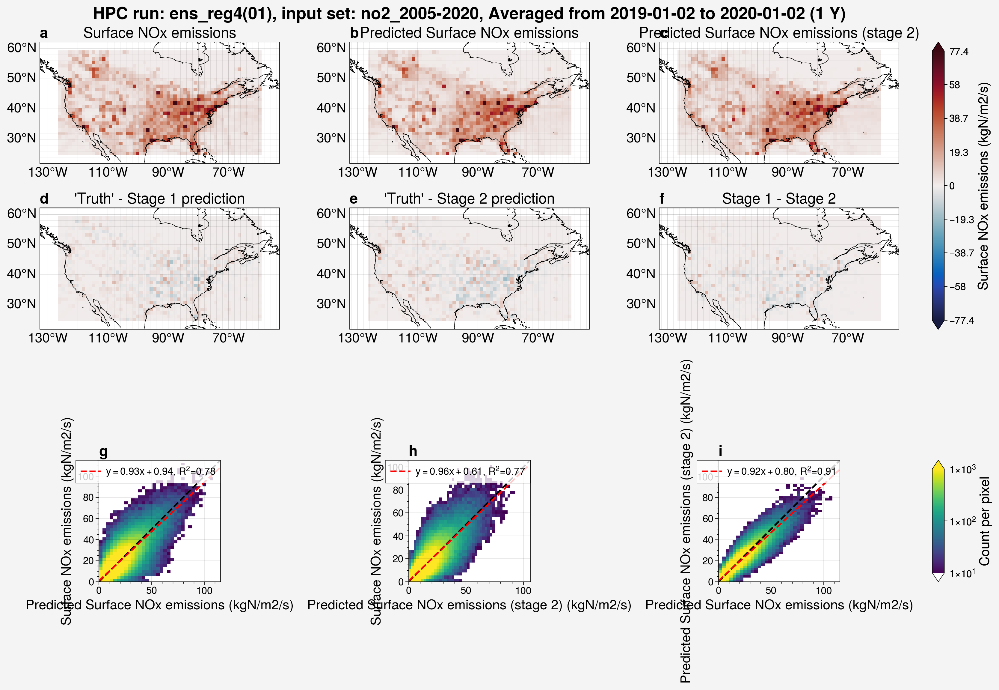

In [2]:
from unox.plotting import plot_run_analysis

var_plots = plot_run_analysis(
    'ens_reg4',
    ens_mem=1,
    restrict_lat_lon_to='datafiles/sample_data/nox_2019_t106_US.nc',
)

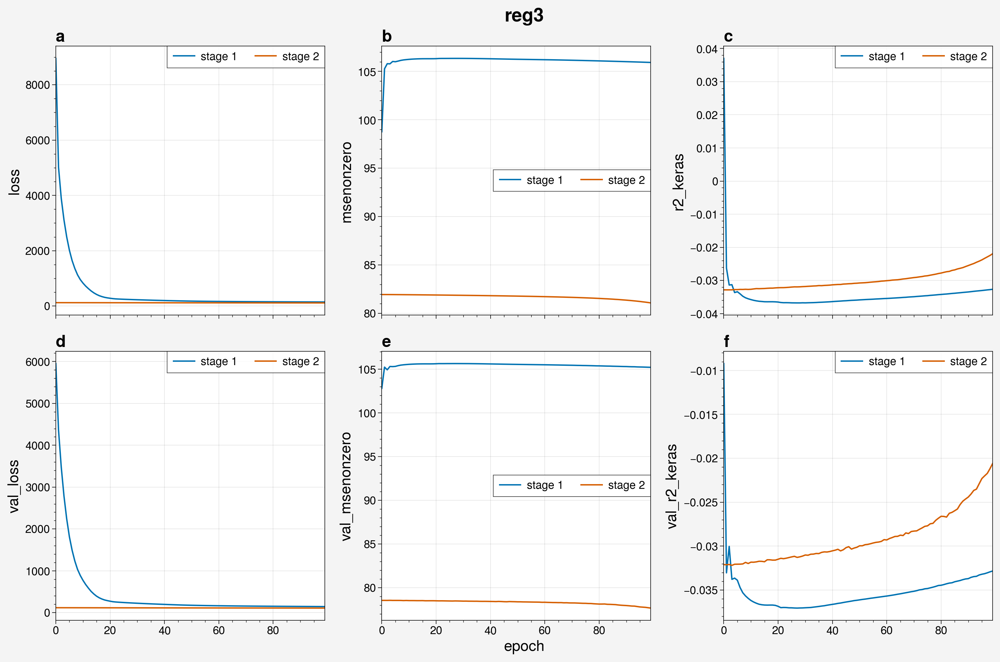

In [ ]:
from unox.plotting import plot_epochs_logs 

this_plot = plot_epochs_logs(
    # 'no2_example_run',
    'reg3',
    is_predict=True,
)

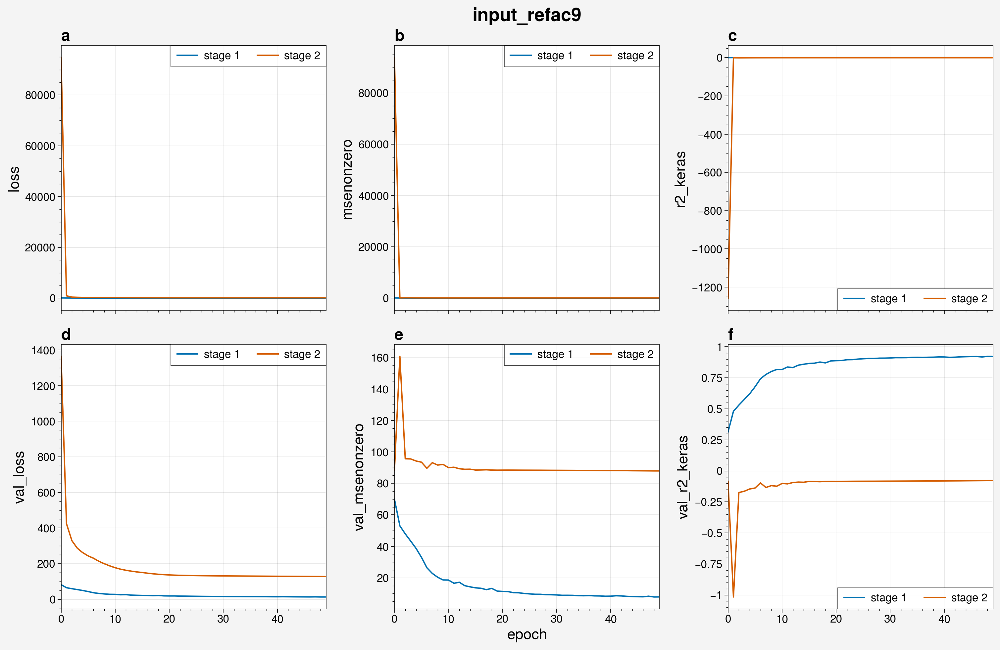

In [4]:
from unox.plotting import plot_epochs_logs 

this_plot = plot_epochs_logs(
    # 'no2_example_run',
    'input_refac9',
    is_predict=True,
)

In [6]:
from unox.HPC.data0.dataset import uarray

this_uarr = uarray('reg4', is_predict=True)
this_uarr.xr

<xarray.Dataset> Size: 39MB
Dimensions:      (time: 728, lat: 56, lon: 120)
Coordinates:
  * time         (time) object 6kB 2019-01-02 00:00:00 ... 2020-12-31 00:00:00
  * lat          (lat) float32 224B 11.78 12.9 14.02 15.14 ... 71.21 72.34 73.46
  * lon          (lon) float32 480B -174.4 -173.2 -172.1 ... -42.75 -41.62 -40.5
Data variables:
    nox_pred     (time, lat, lon) float32 20MB ...
    nox_pred_s2  (time, lat, lon) float32 20MB ...
Attributes: (12/18)
    description:        Predicted Surface NOx emissions using a U-net model
    modification_date:  2026-03-05 17:41:50
    y_var:              nox
    input_set:          no2_2005-2020
    config_path:        inputfiles/_input_configs/sample_config.json
    config_dict:        {'input_set': 'no2_2005-2020', 'x_vars': ['no2', 'no2...
    ...                 ...
    x_vars:             ['no2', 'no2_tm1', 'u10', 'v10', 'blh', 'sp', 'skt', ...
    data_dir:           /data/high_res
    chemra_path:        emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_...
    insitu_path:        US_EPA/NO2/daily_NO2/daily_42602_
    era5_path:          ERA5concatenated
    stages:             [1 2]

In [30]:
from unox.HPC.data0.dataset import uarray

this_uarr = uarray('input_refac1', is_predict=True)
this_uarr.xr

<xarray.Dataset> Size: 39MB
Dimensions:      (time: 731, lat: 56, lon: 120)
Coordinates:
  * time         (time) datetime64[ns] 6kB 2019-01-01 2019-01-02 ... 2020-12-31
  * lat          (lat) float32 224B 11.78 12.9 14.02 15.14 ... 71.21 72.34 73.46
  * lon          (lon) float32 480B -174.4 -173.2 -172.1 ... -42.75 -41.62 -40.5
Data variables:
    nox_pred     (time, lat, lon) float32 20MB ...
    nox_pred_s2  (time, lat, lon) float32 20MB ...
Attributes: (12/23)
    description:                 Predicted Surface NOx emissions using a U-ne...
    modification_date:           2026-03-27 15:03:57
    y_var:                       nox
    input_set:                   no2_2005_2020
    config_path:                 HPC_runs/input_refac1/model_config.json
    model_config:                {'input_set': 'no2_2005_2020', 'x_vars': ['n...
    ...                          ...
    stage_2_original_type:       bool
    attrs_emiss_original_type:   dict
    attrs_chemra_original_type:  dict
    attrs_insitu_original_type:  dict
    attrs_met_original_type:     dict
    stages:                      [1 2]

In [10]:
list(this_uarr.xr.attrs.keys())

['description',
 'modification_date',
 'y_var',
 'input_set',
 'config_path',
 'config_dict',
 'name',
 'x_vars',
 'start_date',
 'end_date',
 'stage_2',
 'stage_2_cutoff',
 'nan_fill',
 'attrs_emiss',
 'attrs_chemra',
 'attrs_insitu',
 'attrs_met',
 'stage_2_original_type',
 'attrs_emiss_original_type',
 'attrs_chemra_original_type',
 'attrs_insitu_original_type',
 'attrs_met_original_type']

/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes i

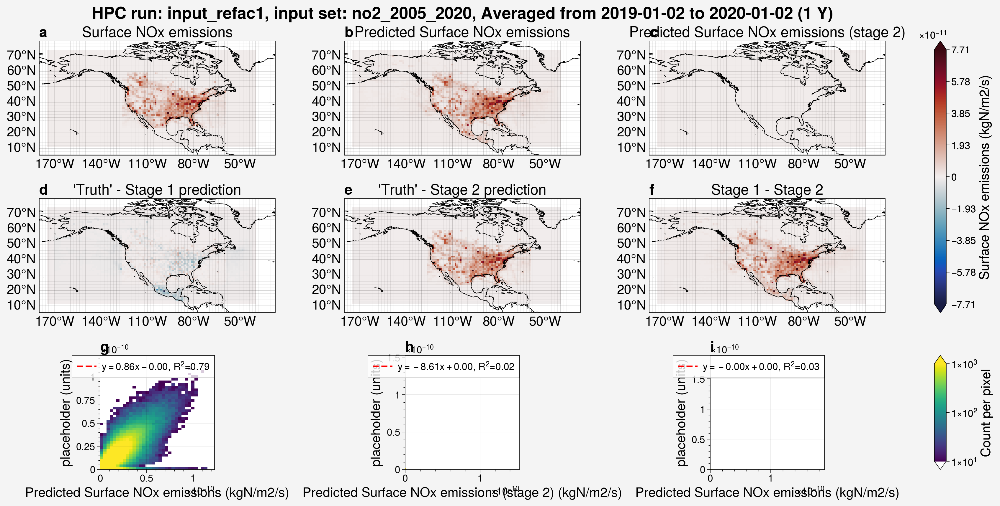

In [31]:
from unox.plotting import plot_run_analysis

var_plots = plot_run_analysis(
    'input_refac1',
    # ens_mem=1,
    # restrict_lat_lon_to='datafiles/sample_data/nox_2019_t106_US.nc',
)

/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "


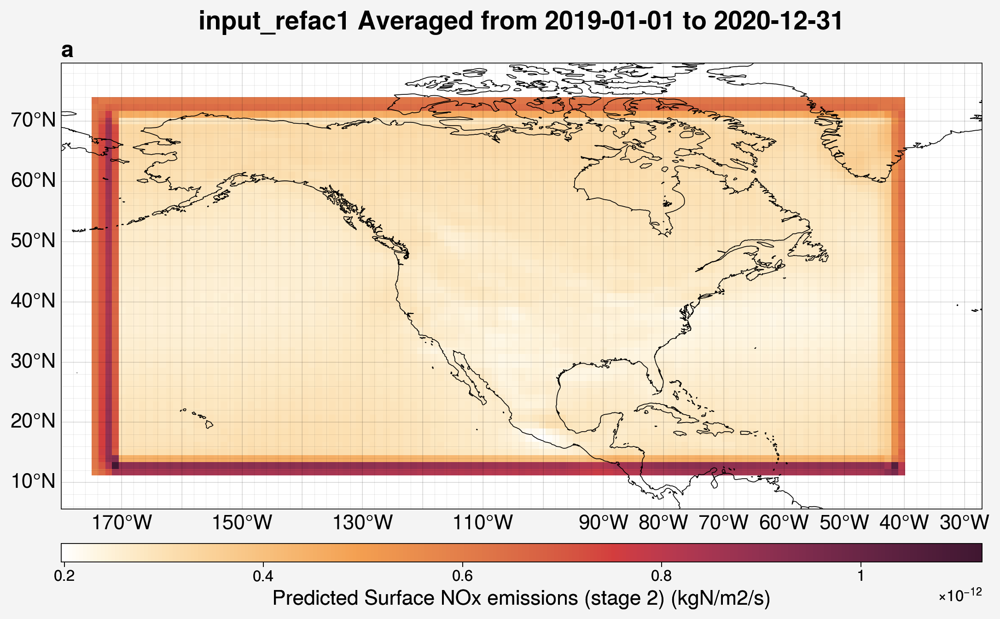

In [32]:
from unox.plotting import plot_var_maps

var_plots = plot_var_maps(
    'input_refac1',
    is_predict=True,
    vars = ['nox_pred_s2'],
    datetime='2019-01-01',
)

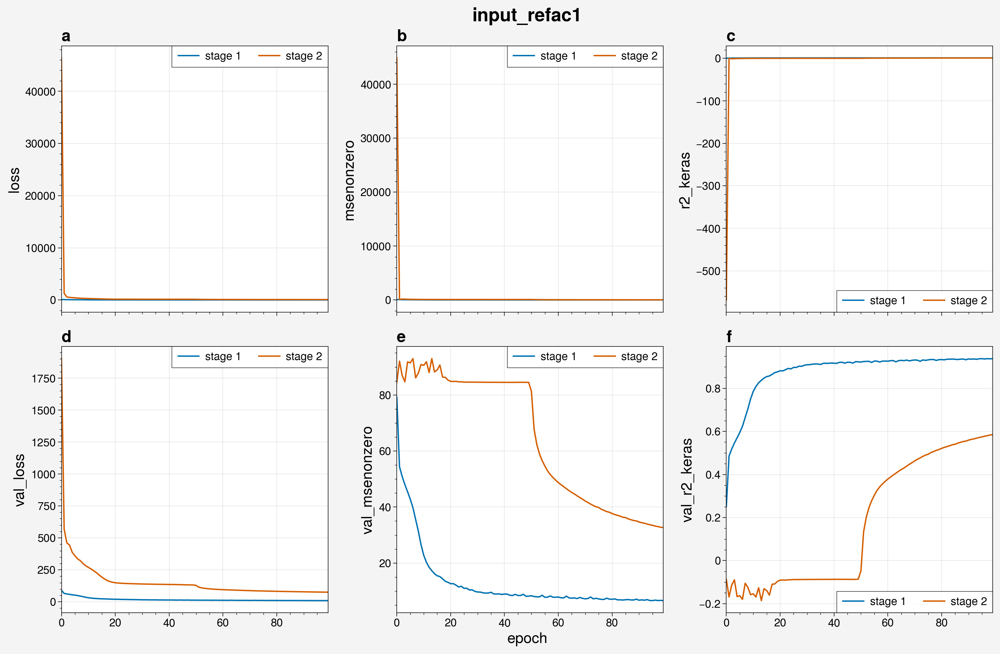

In [33]:
from unox.plotting import plot_epochs_logs 

this_plot = plot_epochs_logs(
    # 'no2_example_run',
    'input_refac1',
    is_predict=True,
)

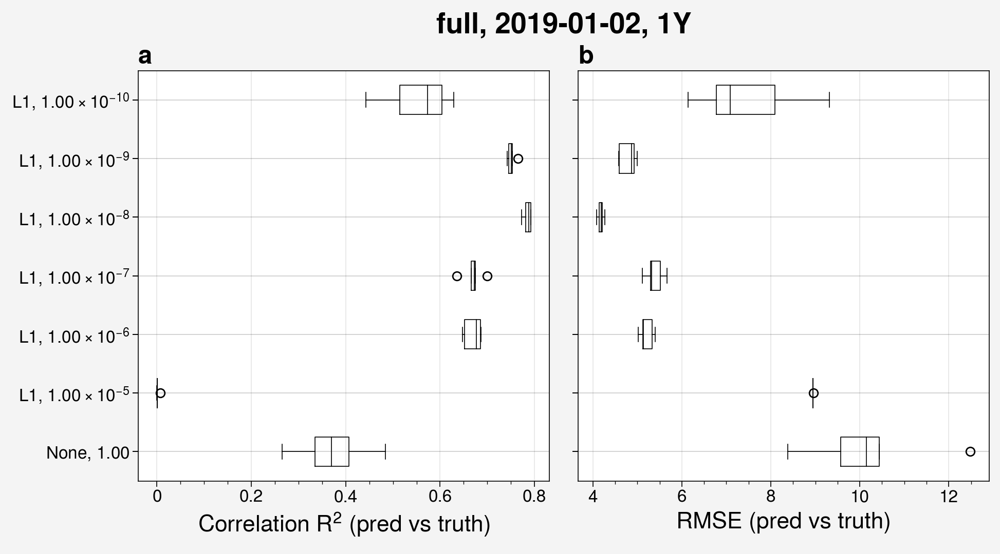

In [ ]:
from unox.plotting import plot_BaW 

this_plot = plot_BaW(
    ['R2', 'RMSE'],
    ['ens_reg0', 'ens_reg1', 'ens_reg2', 'ens_reg3', 'ens_reg4', 'ens_reg5', 'ens_reg6'],
    # ['ens_reg0', 'L2_reg1', 'L2_reg2', 'L2_reg3', 'L2_reg4', 'L2_reg5', 'L2_reg6'],
    ds_kwargs=[
        {
            'is_predict': True,
            'start_date': '2019-01-02',
            'interval': '1Y',
        },
    ],
    label_with=['act_reg', 'act_reg_factor']
)

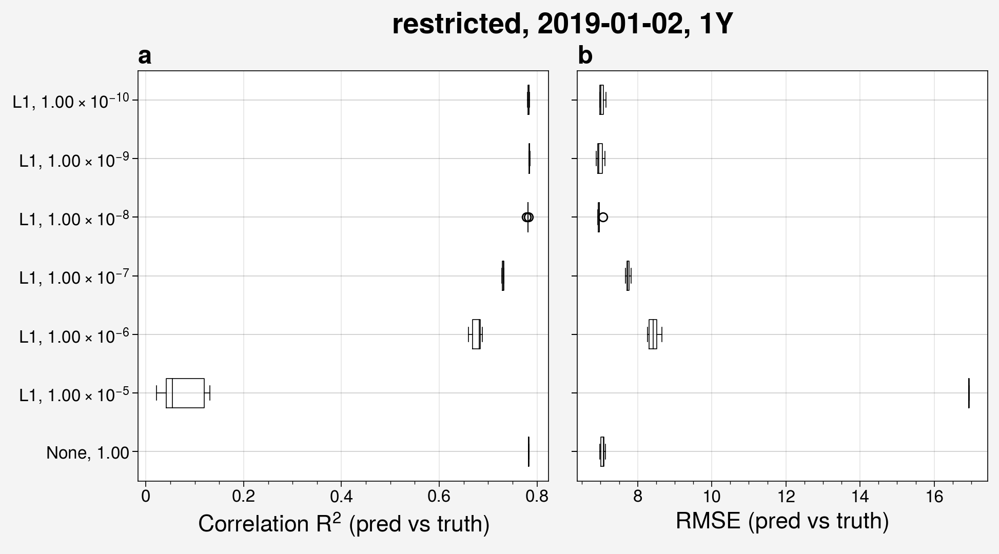

In [ ]:
from unox.plotting import plot_BaW 

this_plot = plot_BaW(
    ['R2', 'RMSE'],
    ['ens_reg0', 'ens_reg1', 'ens_reg2', 'ens_reg3', 'ens_reg4', 'ens_reg5', 'ens_reg6'],
    # ['ens_reg0', 'L2_reg1', 'L2_reg2', 'L2_reg3', 'L2_reg4', 'L2_reg5', 'L2_reg6'],
    ds_kwargs=[
        {
            'is_predict': True,
            'start_date': '2019-01-02',
            'interval': '1Y',
            'restrict_lat_lon_to': 'datafiles/sample_data/nox_2019_t106_US.nc',
        },
    ],
    label_with=['act_reg', 'act_reg_factor']
)

In [ ]:
make_all_input_files(
    output_dir='co_input_test',
    sort=True,
    var='EmisCO_BioBurn',
    emiss_dir='datafiles/HEMCO_diagnostics_merged',
    emiss_pre='HEMCO_diagnostics_',
    emiss_post='.nc',
    data_dir='/data/high_res',
    chemra_path='emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_2hr_no2_sfc_',
    chemra_var='no2',
    insitu_path='US_EPA/NO2/daily_NO2/daily_42602_',
    era5_path='ERA5concatenated',
)

In [ ]:
from unox.HPC.data0.dataset import uarray

pred_u_arr = uarray('no2_example_run', is_predict=True)
pred_u_arr.xr

<xarray.Dataset> Size: 39MB
Dimensions:      (time: 728, lat: 56, lon: 120)
Coordinates:
  * time         (time) object 6kB 2019-01-02 00:00:00 ... 2020-12-31 00:00:00
  * lat          (lat) float32 224B 11.78 12.9 14.02 15.14 ... 71.21 72.34 73.46
  * lon          (lon) float32 480B -174.4 -173.2 -172.1 ... -42.75 -41.62 -40.5
Data variables:
    nox_pred     (time, lat, lon) float32 20MB ...
    nox_pred_s2  (time, lat, lon) float32 20MB ...
Attributes: (12/18)
    description:        Predicted Surface NOx emissions using a U-net model
    modification_date:  2026-01-21 16:32:09
    y_var:              nox
    input_set:          no2_2005-2020
    config_path:        inputfiles/_input_configs/sample_config.json
    config_dict:        {'input_set': 'no2_2005-2020', 'x_vars': ['no2', 'no2...
    ...                 ...
    x_vars:             ['no2', 'no2_tm1', 'u10', 'v10', 'blh', 'sp', 'skt', ...
    data_dir:           /data/high_res
    chemra_path:        emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_...
    insitu_path:        US_EPA/NO2/daily_NO2/daily_42602_
    era5_path:          ERA5concatenated
    stages:             [1 2]

In [ ]:
pred_u_arr._get_metadata()

{'savedir': 'HPC_runs/no2_example_run/',
 'config_path': 'inputfiles/_input_configs/sample_config.json',
 'config_dict': {'input_set': 'no2_2005-2020',
  'x_vars': ['no2',
   'no2_tm1',
   'u10',
   'v10',
   'blh',
   'sp',
   'skt',
   't2m',
   'ssrd'],
  'stage_2': True,
  'stage_2_cutoff': 2013,
  'lsm_vars': [],
  'grid_size': [56, 120]},
 'version': 1,
 'n_epochs': 250,
 'model_fmt': 'keras',
 'input_fmt': 'nc',
 'split_year': 2019,
 'split_value': 0.9,
 'train_years': {'stage1': [2005,
   2006,
   2007,
   2008,
   2009,
   2010,
   2011,
   2012,
   2013,
   2014,
   2015,
   2016,
   2017,
   2018],
  'stage2': [2014, 2015, 2016, 2017, 2018]},
 'pred_years': {'stage1': [2019, 2020], 'stage2': [2019, 2020]},
 'unet_build_shape': [56, 120, 9]}

In [ ]:
pred_u_arr.name

'no2_example_run'

In [ ]:
len(pred_u_arr.xr['nox_pred'].values.flatten())

4892160

In [ ]:
from unox.plotting import BaW_label 
from unox.HPC.data0.dataset import uarray

# pred_u_arr = uarray('no2_example_run', is_predict=True)
# pred_u_arr = uarray('_test_ens_zfi4/test_ens_zfi4_blh', is_predict=True)
pred_u_arr = uarray('L2_reg6', is_predict=True)

BaW_label(
    pred_u_arr,
    var='R2',
    label_with=['act_reg', 'act_reg_factor'],
    # label_with=['name'],
    # one_dataset=True,
)

/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/proplot/__init__.py:6: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources as pkg


'L2, 1.00\\times10^{-10}'

In [ ]:
my_str = '1e-10'
float(my_str)/2

5e-11

---

# Investigating predictions over Mexico

/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes i

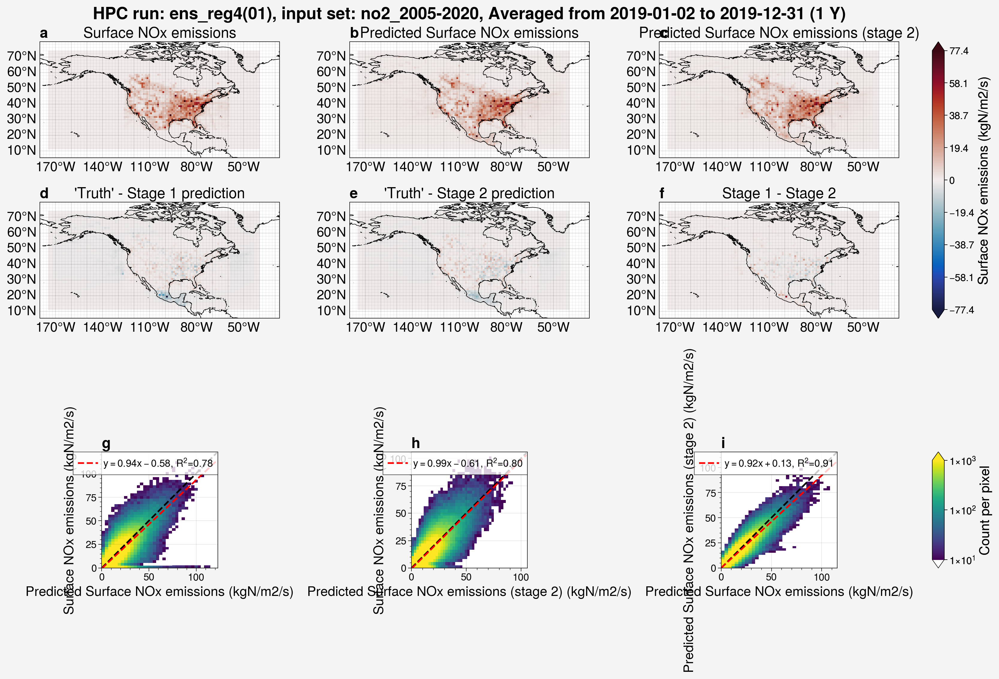

In [ ]:
from unox.plotting import plot_run_analysis

this_plt = plot_run_analysis(
    'ens_reg4',
    ens_mem=1,
    start_date='2019-01-01',
    # interval='4M',
    # restrict_lat_lon_to='datafiles/sample_data/nox_2019_t106_US.nc',
    # stage1_only=True,
)

In [5]:
from unox.HPC.data0.dataset import uarray 

this_run = uarray('reg5', is_predict=True)
this_run.xr

<xarray.Dataset> Size: 39MB
Dimensions:      (time: 728, lat: 56, lon: 120)
Coordinates:
  * time         (time) object 6kB 2019-01-02 00:00:00 ... 2020-12-31 00:00:00
  * lat          (lat) float32 224B 11.78 12.9 14.02 15.14 ... 71.21 72.34 73.46
  * lon          (lon) float32 480B -174.4 -173.2 -172.1 ... -42.75 -41.62 -40.5
Data variables:
    nox_pred     (time, lat, lon) float32 20MB ...
    nox_pred_s2  (time, lat, lon) float32 20MB ...
Attributes: (12/18)
    description:        Predicted Surface NOx emissions using a U-net model
    modification_date:  2026-03-05 19:30:36
    y_var:              nox
    input_set:          no2_2005-2020
    config_path:        config_reg5
    config_dict:        {'input_set': 'no2_2005-2020', 'x_vars': ['no2', 'no2...
    ...                 ...
    x_vars:             ['no2', 'no2_tm1', 'u10', 'v10', 'blh', 'sp', 'skt', ...
    data_dir:           /data/high_res
    chemra_path:        emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_...
    insitu_path:        US_EPA/NO2/daily_NO2/daily_42602_
    era5_path:          ERA5concatenated
    stages:             [1 2]

In [ ]:
from unox.HPC.data0.match_datasets import match_domains


restrict_lat_lon_to='datafiles/sample_data/nox_2019_t106_US.nc',

In [7]:
# Select just the region of the data within the specified lat-lon bounds
lat_min = 30
lat_max = 40
lon_min = -130
lon_max = -60
this_run.xr = this_run.xr.sel(lat=slice(lat_min, lat_max), lon=slice(lon_min, lon_max))
this_run.xr

<xarray.Dataset> Size: 3MB
Dimensions:      (time: 728, lat: 9, lon: 62)
Coordinates:
  * time         (time) object 6kB 2019-01-02 00:00:00 ... 2020-12-31 00:00:00
  * lat          (lat) float32 36B 30.84 31.96 33.08 34.21 ... 37.57 38.69 39.81
  * lon          (lon) float32 248B -129.4 -128.2 -127.1 ... -63.0 -61.88 -60.75
Data variables:
    nox_pred     (time, lat, lon) float32 2MB ...
    nox_pred_s2  (time, lat, lon) float32 2MB ...
Attributes: (12/18)
    description:        Predicted Surface NOx emissions using a U-net model
    modification_date:  2026-03-05 19:30:36
    y_var:              nox
    input_set:          no2_2005-2020
    config_path:        config_reg5
    config_dict:        {'input_set': 'no2_2005-2020', 'x_vars': ['no2', 'no2...
    ...                 ...
    x_vars:             ['no2', 'no2_tm1', 'u10', 'v10', 'blh', 'sp', 'skt', ...
    data_dir:           /data/high_res
    chemra_path:        emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_...
    insitu_path:        US_EPA/NO2/daily_NO2/daily_42602_
    era5_path:          ERA5concatenated
    stages:             [1 2]

/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "


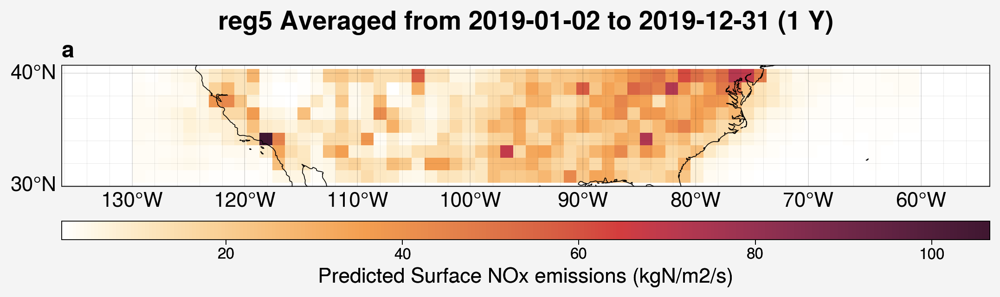

In [8]:
from unox.plotting import plot_var_maps 

this_plt = plot_var_maps(
    # 'reg5',
    # is_predict=True,
    this_run,
    vars=['nox_pred'],
    start_date='2019-01-01',
    interval='1Y',
    # restrict_lat_lon_to=minimal_xr0,
    # padding=0,
)

In [ ]:
import xarray as xr
import numpy as np
from unox.HPC.data0.dataset import uarray

# Create a minimal xarray that covers just Mexico
minimal_xr0 = xr.DataArray(
    data=[[[1], [2]], [[3], [4]]],
    coords={
        # "lat": [11.78, 73.46],
        # "lon": [-40.5, 174.4],
        "lat": [11.78, 26],# 24.112],
        "lon": [-112, -72],
        "time": [np.datetime64("2019-01-02")],
    },
    dims=["lat", "lon", "time"]
)
minimal_xr0
# minimal_urr = uarray(minimal_xr0)
# minimal_urr.xr

<xarray.DataArray (lat: 2, lon: 2, time: 1)> Size: 32B
array([[[1],
        [2]],

       [[3],
        [4]]])
Coordinates:
  * lat      (lat) float64 16B 11.78 26.0
  * lon      (lon) int64 16B -112 -72
  * time     (time) datetime64[ns] 8B 2019-01-02

In [2]:
from unox.HPC.data0.dataset import uarray 

my_ensemble = uarray('ens_reg4', is_predict=True)
my_ensemble.xr

<xarray.Dataset> Size: 196MB
Dimensions:         (time: 728, lat: 56, lon: 120)
Coordinates:
  * time            (time) object 6kB 2019-01-02 00:00:00 ... 2020-12-31 00:0...
  * lat             (lat) float32 224B 11.78 12.9 14.02 ... 71.21 72.34 73.46
  * lon             (lon) float32 480B -174.4 -173.2 -172.1 ... -41.62 -40.5
Data variables:
    nox_pred_01     (time, lat, lon) float32 20MB ...
    nox_pred_s2_01  (time, lat, lon) float32 20MB ...
    nox_pred_02     (time, lat, lon) float32 20MB ...
    nox_pred_s2_02  (time, lat, lon) float32 20MB ...
    nox_pred_03     (time, lat, lon) float32 20MB ...
    nox_pred_s2_03  (time, lat, lon) float32 20MB ...
    nox_pred_04     (time, lat, lon) float32 20MB ...
    nox_pred_s2_04  (time, lat, lon) float32 20MB ...
    nox_pred_05     (time, lat, lon) float32 20MB ...
    nox_pred_s2_05  (time, lat, lon) float32 20MB ...
Attributes: (12/19)
    description:        Predicted Surface NOx emissions using a U-net model
    modification_date:  2026-03-09 15:21:02
    y_var:              nox
    input_set:          no2_2005-2020
    config_path:        HPC_runs/ens_reg4/01_ens_reg4/input_config.json
    config_dict:        {'input_set': 'no2_2005-2020', 'x_vars': ['no2', 'no2...
    ...                 ...
    data_dir:           /data/high_res
    chemra_path:        emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_...
    insitu_path:        US_EPA/NO2/daily_NO2/daily_42602_
    era5_path:          ERA5concatenated
    stages:             [1 2]
    ensemble_size:      5

/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "


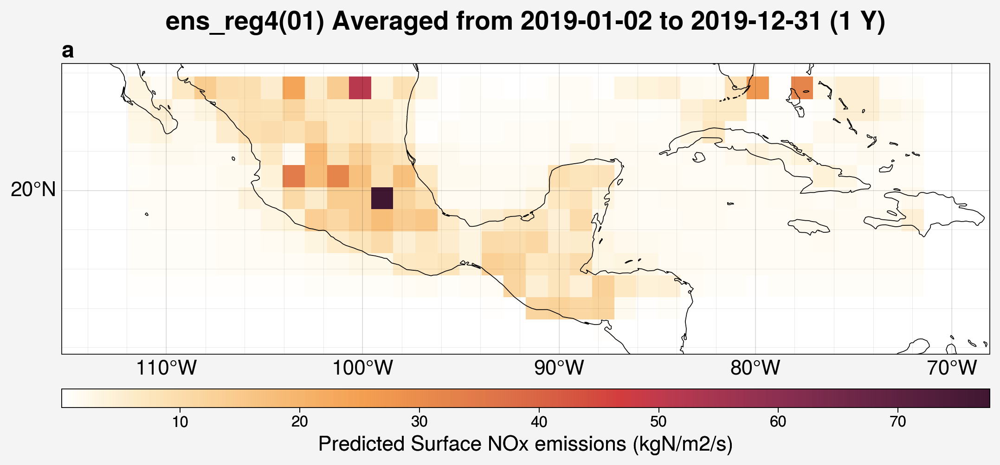

In [ ]:
from unox.plotting import plot_var_maps 

this_plt = plot_var_maps(
    'ens_reg4',
    ens_mem=1,
    is_predict=True,
    vars=['nox_pred'],
    start_date='2019-01-01',
    interval='1Y',
    restrict_lat_lon_to=minimal_xr0,
    # padding=0,
)

/home/mschee/unox/src/unox/HPC/data0/dataset.py:475: UserWarning: (is_ensemble) `dataset` must be a prediction set to check for ensemble members.
  warnings.warn(f"(is_ensemble) `dataset` must be a prediction set to check for ensemble members.")
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "


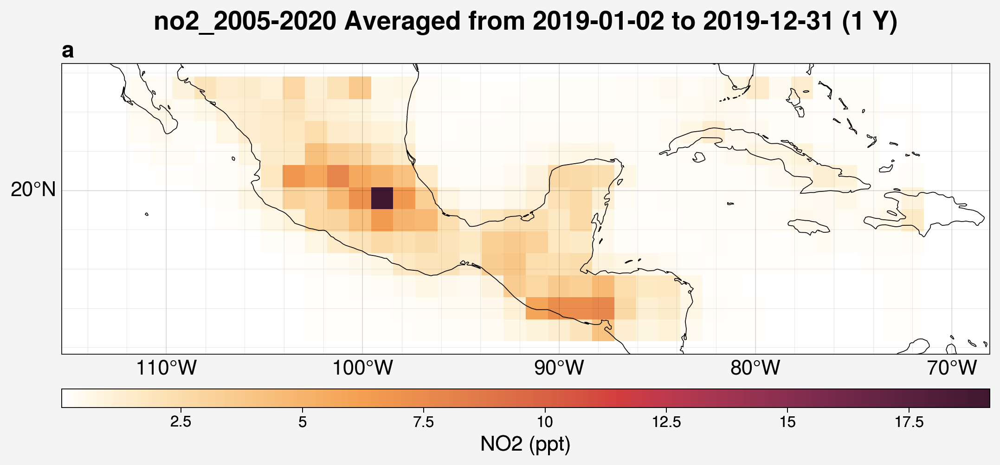

In [ ]:
from unox.plotting import plot_var_maps 

this_plt = plot_var_maps(
    'no2_2005-2020',
    is_input_set=True,
    vars=['no2'],
    start_date='2019-01-01',
    interval='1Y',
    restrict_lat_lon_to=minimal_xr0,
    # padding=0,
)

/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "


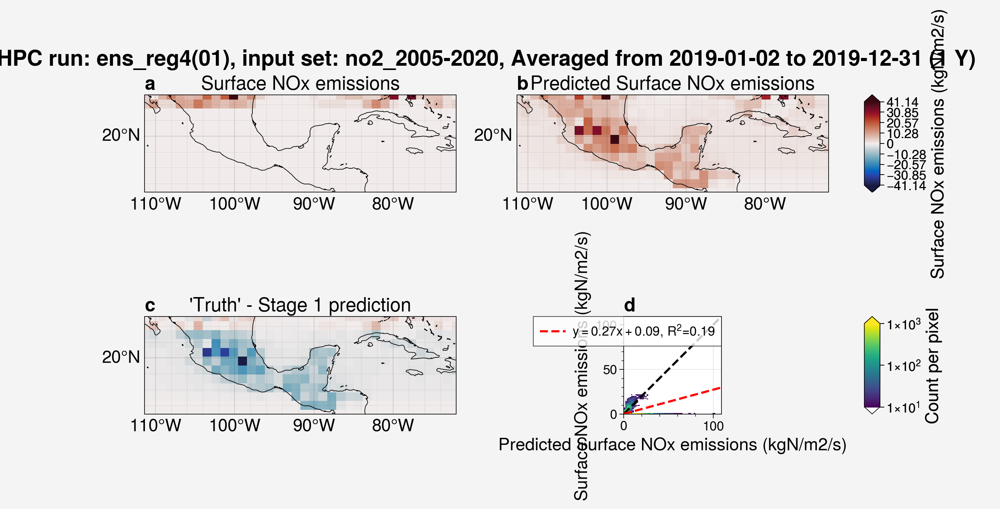

In [ ]:
from unox.plotting import plot_run_analysis

this_plt = plot_run_analysis(
    'ens_reg4',
    ens_mem=1,
    start_date='2019-01-01',
    interval='1Y',
    restrict_lat_lon_to=minimal_xr0,
    stage1_only=True,
    # add_corr_plots=False,
    padding=0,
)

/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "


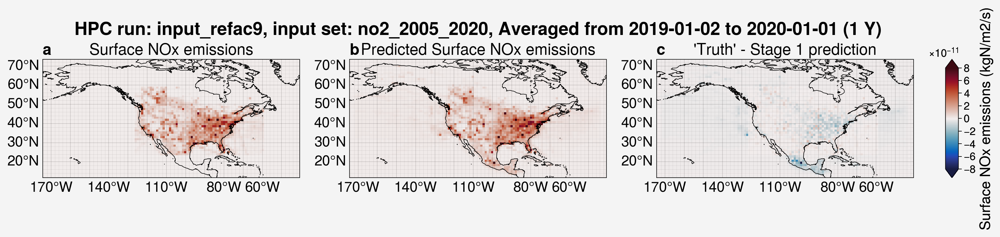

In [13]:
from unox.plotting import plot_run_analysis

this_plt = plot_run_analysis(
    'input_refac9',
    # 'ens_reg4',
    # ens_mem=1,
    start_date='2019-01-01',
    interval='1Y',
    # restrict_lat_lon_to=minimal_xr0,
    stage1_only=True,
    add_corr_plots=False,
    padding=0,
)

In [ ]:
import xarray as xr 

xr.open_dataset("HPC_runs/ens_reg4/predictions.nc")

<xarray.Dataset> Size: 196MB
Dimensions:         (time: 728, lat: 56, lon: 120)
Coordinates:
  * time            (time) object 6kB 2019-01-02 00:00:00 ... 2020-12-31 00:0...
  * lat             (lat) float32 224B 11.78 12.9 14.02 ... 71.21 72.34 73.46
  * lon             (lon) float32 480B -174.4 -173.2 -172.1 ... -41.62 -40.5
Data variables:
    nox_pred_01     (time, lat, lon) float32 20MB ...
    nox_pred_s2_01  (time, lat, lon) float32 20MB ...
    nox_pred_02     (time, lat, lon) float32 20MB ...
    nox_pred_s2_02  (time, lat, lon) float32 20MB ...
    nox_pred_03     (time, lat, lon) float32 20MB ...
    nox_pred_s2_03  (time, lat, lon) float32 20MB ...
    nox_pred_04     (time, lat, lon) float32 20MB ...
    nox_pred_s2_04  (time, lat, lon) float32 20MB ...
    nox_pred_05     (time, lat, lon) float32 20MB ...
    nox_pred_s2_05  (time, lat, lon) float32 20MB ...
Attributes: (12/19)
    description:        Predicted Surface NOx emissions using a U-net model
    modification_date:  2026-03-09 15:21:02
    y_var:              nox
    input_set:          no2_2005-2020
    config_path:        HPC_runs/ens_reg4/01_ens_reg4/input_config.json
    config_dict:        {'input_set': 'no2_2005-2020', 'x_vars': ['no2', 'no2...
    ...                 ...
    data_dir:           /data/high_res
    chemra_path:        emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_...
    insitu_path:        US_EPA/NO2/daily_NO2/daily_42602_
    era5_path:          ERA5concatenated
    stages:             [1 2]
    ensemble_size:      5

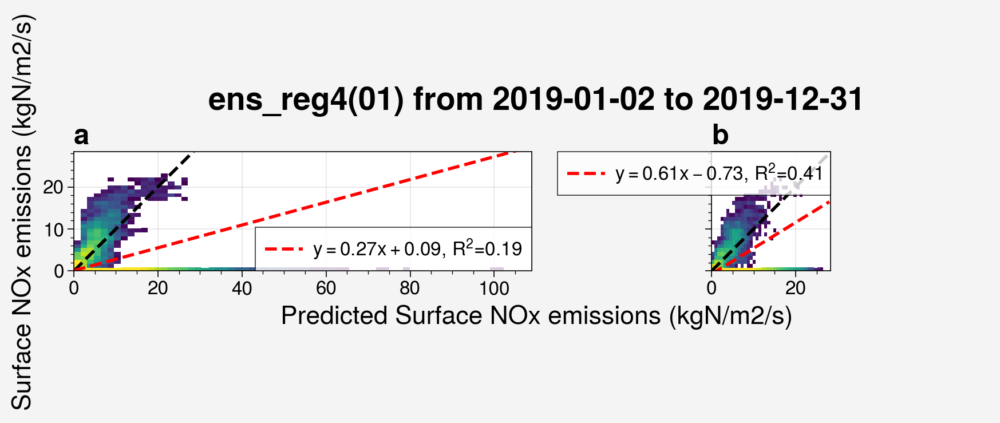

In [ ]:
from unox.plotting import corr_plot

this_plt = corr_plot(
    'ens_reg4',
    is_predict=True,
    ens_mem=1,
    start_date='2019-01-01',
    interval='1Y',
    x_vars=['pred', 'pred_s2'],
    y_vars=['truth', 'truth'],
    # x_vars=['pred', 'pred_s2', 'pred'],
    # y_vars=['truth', 'truth', 'pred_s2'],
    # x_vars=['pred'],
    # y_vars=['truth'],
    restrict_lat_lon_to=minimal_xr0,
)

---

# Grid cell area

In [ ]:
import xarray as xr

xr.open_dataset("inputfiles/no2_2019_JFM/no2_2019_JFM.nc")

<xarray.Dataset> Size: 62MB
Dimensions:     (time: 89, lat: 56, lon: 120, var: 1)
Coordinates:
  * lat         (lat) float32 224B 11.78 12.9 14.02 15.14 ... 71.21 72.34 73.46
  * lon         (lon) float32 480B -174.4 -173.2 -172.1 ... -42.75 -41.62 -40.5
  * time        (time) object 712B 2019-01-02 00:00:00 ... 2019-03-31 00:00:00
Dimensions without coordinates: var
Data variables: (12/13)
    nox         (time, lat, lon, var) float64 5MB ...
    no2         (time, lat, lon) float64 5MB ...
    no2_s2      (time, lat, lon) float64 5MB ...
    no2_tm1     (time, lat, lon) float64 5MB ...
    no2_s2_tm1  (time, lat, lon) float64 5MB ...
    u10         (time, lat, lon) float64 5MB ...
    ...          ...
    blh         (time, lat, lon) float64 5MB ...
    sp          (time, lat, lon) float64 5MB ...
    skt         (time, lat, lon) float64 5MB ...
    t2m         (time, lat, lon) float64 5MB ...
    ssrd        (time, lat, lon) float64 5MB ...
    lsm         (time, lat, lon) float64 5MB ...
Attributes: (12/17)
    description:        Input data for the Unet model. Data for each year is ...
    y_var:              nox
    emiss_dir:          /data/high_res/emacdonald/unet/datafiles/t106
    emiss_pre:          nox_
    emiss_post:         _t106_US.nc
    nan_fill:           0
    ...                 ...
    x2_vars:            ['no2_s2', 'no2_s2_tm1', 'u10', 'v10', 'blh', 'sp', '...
    data_dir:           /data/high_res
    chemra_path:        emacdonald/unet/datafiles/TROPESS/TROPESS_reanalysis_...
    insitu_path:        US_EPA/NO2/daily_NO2/daily_42602_
    era5_path:          ERA5concatenated
    stages:             [1 2]

In [ ]:
import xarray as xr

xr.open_dataset("inputfiles/no2_2019_JFM/no2_2019_JFM_area.nc")

<xarray.Dataset> Size: 54kB
Dimensions:    (lon: 120, lat: 56)
Coordinates:
  * lon        (lon) float32 480B -174.4 -173.2 -172.1 ... -42.75 -41.62 -40.5
  * lat        (lat) float32 224B 11.78 12.9 14.02 15.14 ... 71.21 72.34 73.46
Data variables:
    cell_area  (lat, lon) float64 54kB ...
Attributes:
    CDI:          Climate Data Interface version 2.0.4 (https://mpimet.mpg.de...
    Conventions:  CF-1.6
    history:      Thu Mar 19 10:59:49 2026: cdo gridarea inputfiles/no2_2019_...
    CDO:          Climate Data Operators version 2.0.4 (https://mpimet.mpg.de...

---

# Spatial Statistics

In [ ]:
from unox.HPC.data0.dataset import spatial_stats

# spatial_stats(
#     dataset = 'datafiles/sample_data/2019u10.nc',
#     is_input_set = False,
#     is_predict = False,
#     vars = 'u10',
#     stats = 'mean',
#     restrict_lat_lon_to = None,
# )

# spatial_stats(
#     dataset = 'no2_2019_JFM',
#     is_input_set = True,
#     is_predict = False,
#     vars = ['nox', 'u10'],
#     stats = ['mean', 'sum'],
#     restrict_lat_lon_to = None,
# )

spatial_stats(
    dataset = 'no2_example_run',
    is_input_set = False,
    is_predict = True,
    vars = ['nox_pred', 'nox_pred_s2'],
    stats = ['mean', 'sum'],
    restrict_lat_lon_to = None,
)

<xarray.Dataset> Size: 17kB
Dimensions:           (time: 728)
Coordinates:
  * time              (time) object 6kB 2019-01-02 00:00:00 ... 2020-12-31 00...
Data variables:
    nox_pred_mean     (time) float32 3kB 6.922 6.915 7.239 ... 7.176 7.2 6.948
    nox_pred_s2_mean  (time) float32 3kB 6.556 6.664 6.612 ... 6.678 6.663 6.536
    nox_pred_sum      (time) float32 3kB 4.652e+04 4.647e+04 ... 4.669e+04
    nox_pred_s2_sum   (time) float32 3kB 4.406e+04 4.479e+04 ... 4.392e+04
Attributes:
    source_name:          no2_example_run
    source_metadata:      {'description': 'Predicted Surface NOx emissions us...
    description:          Spatial statistics of data from no2_example_run.
    vars:                 ['nox_pred', 'nox_pred_s2']
    stats:                ['mean', 'sum']
    restrict_lat_lon_to:  None
    kwargs:               {'is_input_set': False, 'is_predict': True}

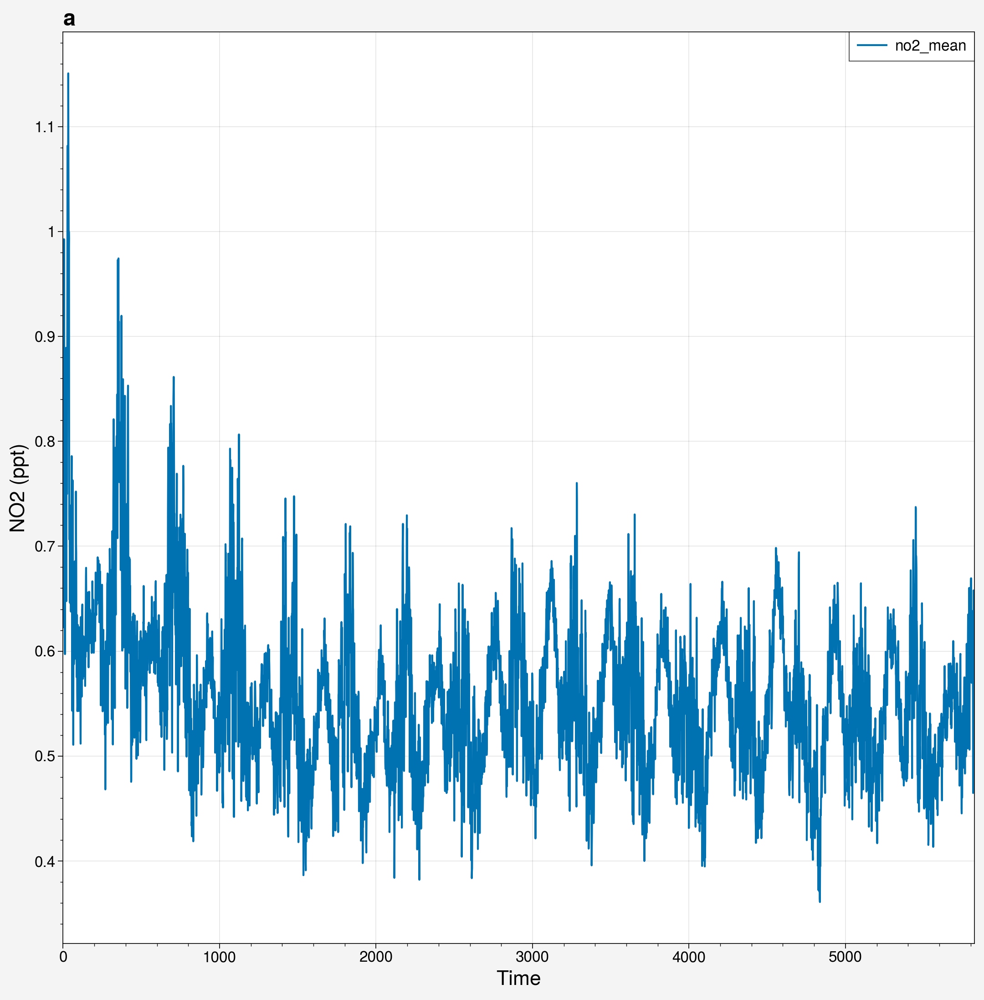

In [ ]:
from unox.plotting import plot_time_series

this_plt = plot_time_series(
    'no2_2005-2020',
    ['no2'],
    ['mean'],
    is_input_set=True
)

/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/proplot/__init__.py:6: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources as pkg


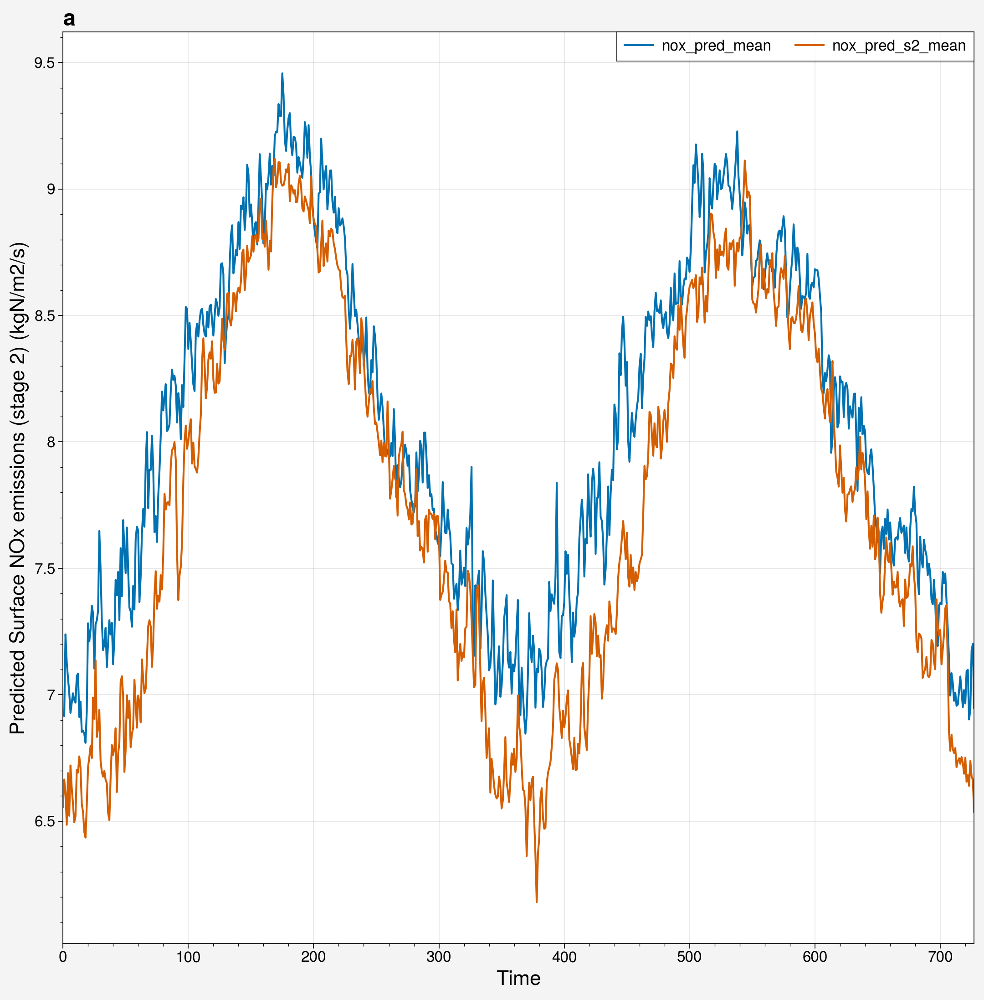

In [ ]:
from unox.plotting import plot_time_series

this_plt = plot_time_series(
    'no2_example_run',
    ['nox_pred', 'nox_pred_s2'],
    ['mean'],
    is_predict=True
)

/home/mschee/miniconda3/envs/uplt/lib/python3.9/site-packages/proplot/__init__.py:6: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources as pkg


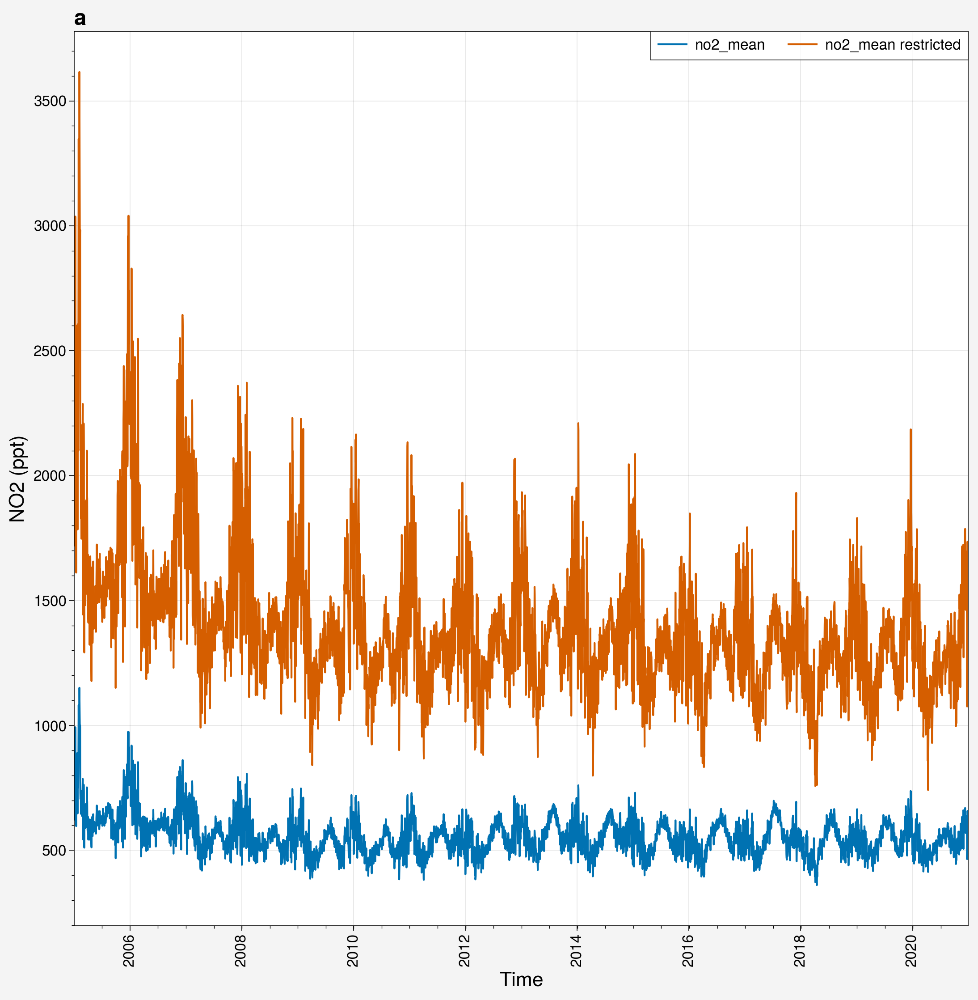

In [1]:
from unox.plotting import plot_time_series

this_plt = plot_time_series(
    'no2_2005_2020',
    ['no2'],
    ['mean'],
    is_input_set=True,
    restrict_lat_lon_to='datafiles/sample_data/nox_2019_t106_US.nc',
)

In [ ]:
from unox.HPC.data0.dataset import spatial_stats

# spatial_stats(
#     dataset = 'datafiles/sample_data/2019u10.nc',
#     is_input_set = False,
#     is_predict = False,
#     vars = 'u10',
#     stats = 'mean',
#     restrict_lat_lon_to = None,
# )

ds_spatial = spatial_stats(
    dataset = 'input_refactor1',
    is_input_set = True,
    is_predict = False,
    vars = ['nox', 'u10'],
    stats = ['mean', 'sum'],
    restrict_lat_lon_to = None,
)
ds_spatial

<xarray.Dataset> Size: 35kB
Dimensions:   (time: 1095)
Coordinates:
  * time      (time) datetime64[ns] 9kB 2017-01-01 2017-01-02 ... 2019-12-31
Data variables:
    nox_mean  (time) float32 4kB 1.837e-12 1.999e-12 ... 2.097e-12 2.081e-12
    u10_mean  (time) float64 9kB -0.9116 -0.9551 -0.7139 ... 0.2065 0.2868
    nox_sum   (time) float32 4kB 1.235e-08 1.343e-08 ... 1.409e-08 1.398e-08
    u10_sum   (time) float64 9kB -6.126e+03 -6.418e+03 ... 1.388e+03 1.927e+03
Attributes:
    source_name:          input_refactor1
    source_metadata:      {'name': 'input_refactor1', 'y_var': 'nox', 'x_vars...
    description:          Spatial statistics of data from input_refactor1.
    vars:                 ['nox', 'u10']
    stats:                ['mean', 'sum']
    restrict_lat_lon_to:  None
    kwargs:               {'is_input_set': True, 'is_predict': False}

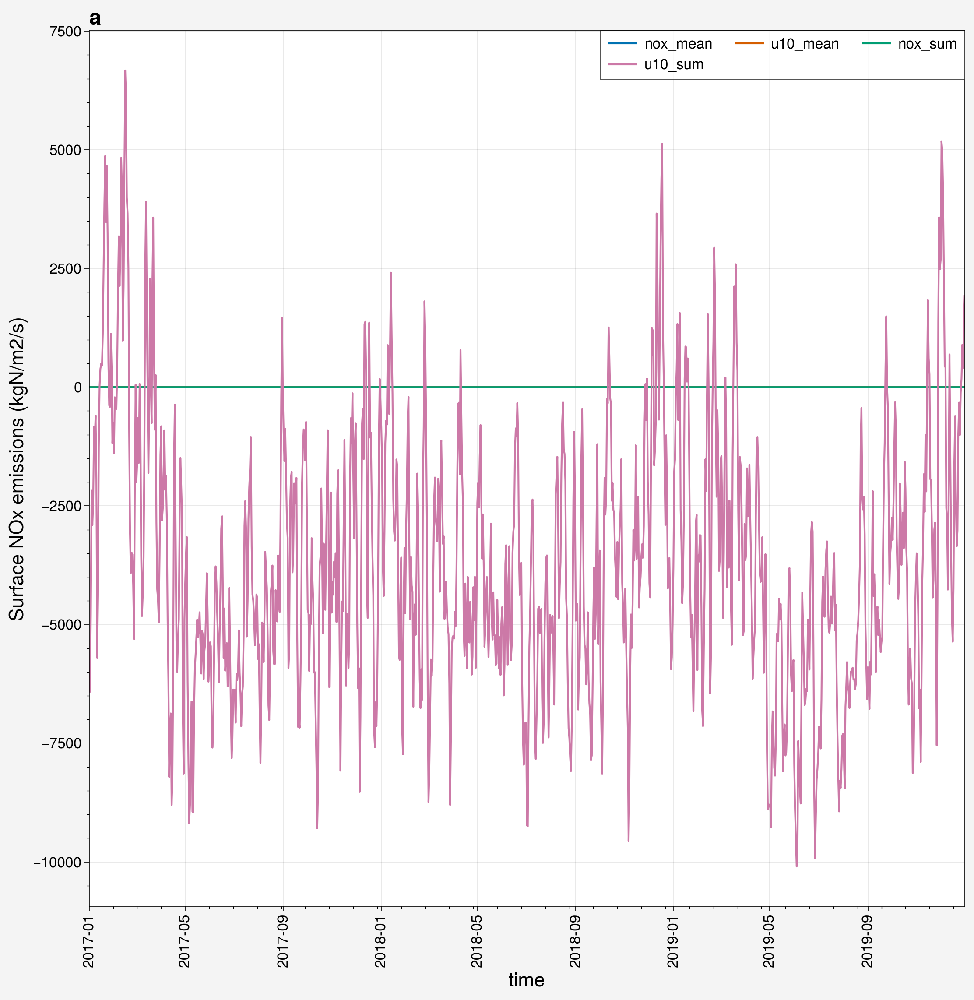

In [ ]:
import proplot as pplt

fig = pplt.figure(refwidth=10)
ax = fig.add_subplot()

# Plot each variable from ds_spatial on the same axes, with a legend
for var in ds_spatial.data_vars:
    ax.plot(ds_spatial['time'], ds_spatial[var], label=var)
ax.legend()
